# Pandas, Sklearn

# Import Libraries

In [1]:
import seaborn as sns
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import matplotlib.dates as dt
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
import warnings
import math
import datetime
from datetime import datetime
warnings.filterwarnings('ignore')
from datetime import datetime
from datetime import timedelta
%matplotlib inline

import folium 
from folium import plugins
from folium.plugins import MarkerCluster
from folium.plugins import HeatMap

from datetime import datetime
import json 
from datetime import datetime

#Processing libraries
from sklearn.preprocessing import StandardScaler,MinMaxScaler

# Model libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC, NuSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, ExtraTreesClassifier, VotingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB

# Testing libraries
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV, learning_curve
from sklearn.metrics import accuracy_score, log_loss, confusion_matrix, classification_report, roc_curve, auc


In [2]:
case = pd.read_csv('Case.csv',index_col=0)
p_info = pd.read_csv('PatientInfo.csv',index_col=0)
time = pd.read_csv('Time.csv')
t_age = pd.read_csv('TimeAge.csv')
t_gender = pd.read_csv('TimeGender.csv')
t_province = pd.read_csv('TimeProvince.csv')
region = pd.read_csv('Region.csv',index_col=0)
weather = pd.read_csv('Weather.csv')
search = pd.read_csv('SearchTrend.csv')
floating = pd.read_csv('SeoulFloating.csv')
policy = pd.read_csv('Policy.csv',index_col=0)
population = pd.read_csv('Population_2020.csv')

# ETL
## (see "Analysis_ETL" for explanation!)

In [47]:
#Conversione da carattere a valore nil
case.latitude[(case.latitude=='-')]= np.nan
case.longitude[(case.longitude=='-')]= np.nan
case["latitude"]=case["latitude"].astype(float)
case["longitude"]=case["longitude"].astype(float)

In [3]:
p_info['age'] =p_info['age'].str.replace('s', '') #sostituisco la 's' a fine numero di età con il campo vuoto
p_info['age'] =p_info['age'].astype(float) #modifico il tipo da stringa a float

#dei valori mancanti ne faccio un fill con la media decade
media = p_info['age'].mean()
quoziente = int(media)/10
media_decade = quoziente*10
p_info['age']=p_info['age'].fillna(media_decade)
p_info['age'] =p_info['age'].astype(int) #modifico il tipo da stringa a int
p_city = p_info.city.isnull()

lista_prov = p_info[p_info['city'].isnull()].province.unique().tolist()

for prov in lista_prov:
    if prov=='Gwangju':
        moda_prov='Gwangju'
    else :
        moda_prov1=p_info[(p_info['province']==prov)].city.mode()
        moda_prov=moda_prov1.loc[0]
    i=0
    for cond in p_info['province']==prov:
        if cond:
            if (p_city[p_city.index[i]]).any():
                p_info.city[p_info.index[i]]=moda_prov
        i=i+1


In [68]:
p_info['infection_case']=p_info['infection_case'].fillna('unknown')
p_info['infected_by']=p_info['infected_by'].fillna('patient not found')
p_info.drop('contact_number', axis=1, inplace=True)


In [51]:
p_info[p_info['confirmed_date'].isnull()].index.tolist() #sulla connfirmed_date mancano tre date nel dataset

[6011000051, 6011000052, 6011000053]

In [53]:
p_info['confirmed_date']=p_info['confirmed_date'].fillna('2020-04-20')
dateFormatter = "%Y-%m-%d"
p_released= p_info.released_date.isnull()

somma=timedelta(0)
k=0

for i in p_info.index:
    if not p_released[i].any():
        data1 = datetime.strptime(p_info.released_date[i], dateFormatter)
        data2 = datetime.strptime(p_info.confirmed_date[i], dateFormatter)
        diff = data1-data2
        somma = somma + diff
        k = k+1

media_rilascio = somma/k 
media_rilascio_giorni = timedelta(media_rilascio.days)
p_state = (p_info.state == 'released') #abbiamo riempito solo le righe 'released'

for i in p_info.index: 
    if p_state[i].any():
        if p_released[i].any():
            data_confirmed = datetime.strptime(p_info.confirmed_date[i], dateFormatter)
            p_info.released_date[i] = data_confirmed + media_rilascio_giorni
dateFormatter = "%Y-%m-%d"
p_deceased= p_info.deceased_date.isnull()

somma=timedelta(0)
k=0

for i in p_info.index:
    if not p_deceased[i].any():
        data1 = datetime.strptime(p_info.deceased_date[i], dateFormatter)
        data2 = datetime.strptime(p_info.confirmed_date[i], dateFormatter)
        diff_deceased = data1-data2
        somma = somma + diff
        k = k+1

media_morte = somma/k
p_info['released_date']= pd.to_datetime(p_info['released_date'])
p_info['confirmed_date']= pd.to_datetime(p_info['confirmed_date'])
p_info['deceased_date']= pd.to_datetime(p_info['deceased_date'])
p_info['symptom_onset_date']=pd.to_datetime(p_info['symptom_onset_date'], errors='coerce') #coerce serve per togliere un valore mismatched nel dataframe

In [54]:
time['date']= pd.to_datetime(time['date'])
t_age['date']= pd.to_datetime(t_age['date'])
t_age['age'] =t_age['age'].str.replace('s', '') #sostituisco la 's' a fine numero di età con il campo vuoto
t_age['age'] =t_age['age'].astype(int) #modifico il tipo da stringa a float
t_gender['date']= pd.to_datetime(t_gender['date'])
t_province['date']= pd.to_datetime(t_province['date'])

In [55]:
weather['date']= pd.to_datetime(weather['date'])
media_prov_avg = weather[(weather['province']==prov)].avg_temp.mean()
weather_avg_temp = weather.avg_temp.isnull()

lista_prov1 = weather['province'].unique().tolist()
i=0

for wat in weather_avg_temp:
    if wat:
        prov = weather.province[i]
        media_prov_avg = weather[(weather['province']==prov)].avg_temp.mean()
        weather.avg_temp[i] = media_prov_avg
    i=i+1
media_prov_min = weather[(weather['province']==prov)].min_temp.mean()
weather_min_temp = weather.min_temp.isnull()

lista_prov1 = weather['province'].unique().tolist()
i=0

for wat in weather_min_temp:
    if wat:
        prov = weather.province[i]
        media_prov_min = weather[(weather['province']==prov)].min_temp.mean()
        weather.min_temp[i] = media_prov_min
    i=i+1
media_prov_max = weather[(weather['province']==prov)].max_temp.mean()
weather_max_temp = weather.max_temp.isnull()

lista_prov1 = weather['province'].unique().tolist()
i=0

for wat in weather_max_temp:
    if wat:
        prov = weather.province[i]
        media_prov_max = weather[(weather['province']==prov)].max_temp.mean()
        weather.max_temp[i] = media_prov_max
    i=i+1
media_prov_max_wind = weather[(weather['province']==prov)].max_wind_speed.mean()
weather_max_wind_speed = weather.max_wind_speed.isnull()

lista_prov1 = weather['province'].unique().tolist()
i=0

for wat in weather_max_wind_speed:
    if wat:
        prov = weather.province[i]
        media_prov_max_wind = weather[(weather['province']==prov)].max_wind_speed.mean()
        weather.max_wind_speed[i] = media_prov_max_wind
    i=i+1
media_prov_most = weather[(weather['province']==prov)].most_wind_direction.mean()
weather_most_wind_direction = weather.most_wind_direction.isnull()

lista_prov1 = weather['province'].unique().tolist()
i=0

for wat in weather_most_wind_direction:
    if wat:
        prov = weather.province[i]
        media_prov_most = weather[(weather['province']==prov)].most_wind_direction.mean()
        weather.most_wind_direction[i] = media_prov_most
    i=i+1
media_prov_avg_r = weather[(weather['province']==prov)].avg_relative_humidity.mean()
weather_avg_relative_humidity= weather.avg_relative_humidity.isnull()

lista_prov1 = weather['province'].unique().tolist()
i=0

for wat in weather_avg_relative_humidity:
    if wat:
        prov = weather.province[i]
        media_prov_avg_r = weather[(weather['province']==prov)].avg_relative_humidity.mean()
        weather.avg_relative_humidity[i] = media_prov_avg_r
    i=i+1
search['date']= pd.to_datetime(search['date'])
floating['date']= pd.to_datetime(floating['date'])
policy['detail']=policy['detail'].fillna('not detail')
policy['start_date']= pd.to_datetime(policy['start_date'])
policy['end_date']=policy['end_date'].fillna('2020-07-01')
policy['end_date']= pd.to_datetime(policy['end_date'])
population.rename(columns={'Unnamed: 0': 'Province', 'Unnamed: 1': 'Origin'}, inplace=True)
population['Province'] =population['Province'].str.replace('0', '-')
for column in population.columns[2:]:
    population[column] =population[column].str.replace(',', '')
    population[column] =population[column].astype(int)

# Descriptive Data Analysis

In [56]:
print( "Primo infetto in Corea:",time['date'][0])

Primo infetto in Corea: 2020-01-20 00:00:00


It is immediately evident that the three most affected provinces were Seoul, Gyeonggi-do and Gyeonsangbuk-do, which are also among the provinces with the most inhabitants. In particular, it is Seoul that has the sad distinction of having had more infections, with over 1300 cases, being the province of South Korea with the highest population density. Fortunately, for the rest of the provinces there was a much lower number of infections, all under 400 cases. To create this histogram, the data from the dataset with patient data, ie “p-info”, and in particular its “province” column were taken.

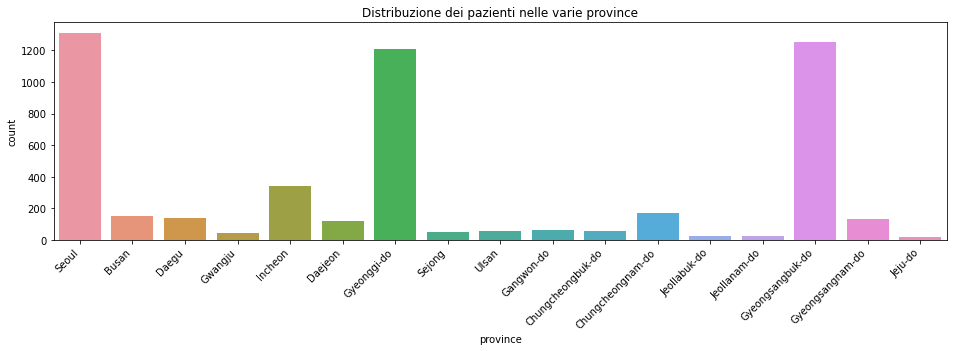

In [57]:
plt.figure(figsize=(16,4))
ax = sns.countplot(p_info['province'])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title('Distribuzione dei pazienti nelle varie province')
plt.show()

In this violinplot the cases are analyzed according to the country of origin, in particular the distribution of cases in the various age groups by country of origin is shown. The positives originating from Korea cover all age groups of course, but in a similar way almost all age groups are also covered by patients from neighboring China, a country very affected by the virus. There were also many positives among Americans visiting Korea. Finally, Thailand, Bangladesh and Indonesia also appear, even if they cover more restricted age groups. To create this violinplot, the dataset with patient data was taken, ie “p-info”, and in particular its “country” and “age” columns.

<AxesSubplot:xlabel='group', ylabel='province'>

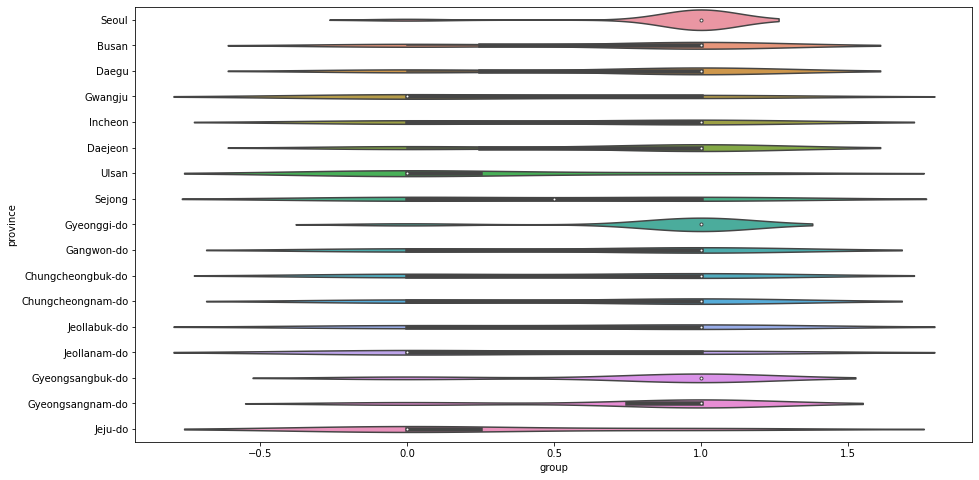

In [58]:
plt.figure(figsize = (15,8)) 
sns.violinplot('group', 'province',data = case)

The distribution of patients by gender is shown. It is observed from the histogram that there have been more infections among women, with over 2200 cases, compared to those among men who have been about 1800. These numbers correspond in percentage to just under 55 \% of women and slightly more than 45 \% of men, as can be seen from the pie chart opposite. To create these two graphs, the dataset with patient information was always used, ie “p-info”, in particular its “sex” column.

C'è differenza tra il numero di donne e di uomini


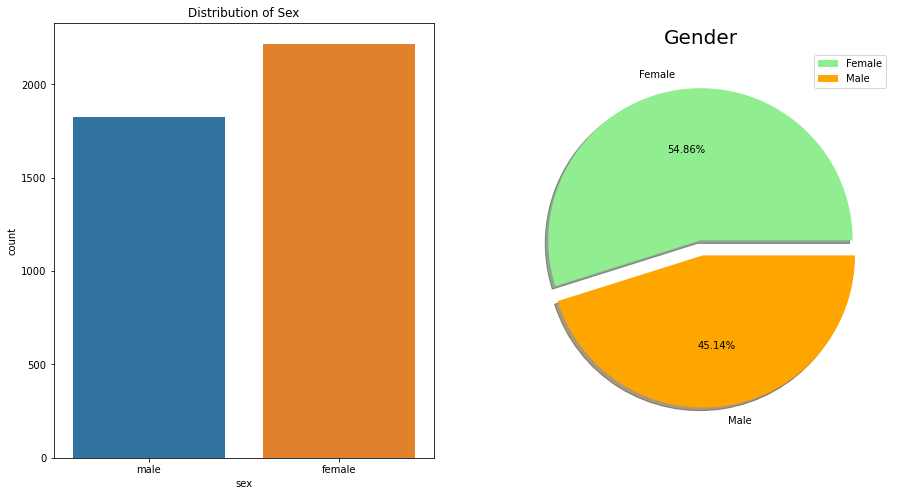

In [59]:
print(f"C'è differenza tra il numero di donne e di uomini" )
plt.figure(figsize=(15,8))
plt.subplot(1, 2, 1)
sns.countplot(p_info['sex'])
plt.title('Distribution of Sex')

plt.subplot(1, 2, 2)
labels = ['Female', 'Male']
size = p_info['sex'].value_counts()
colors = ['lightgreen', 'orange']
explode = [0, 0.1]


plt.pie(size, colors = colors, explode = explode, labels = labels, shadow = True, autopct = '%.2f%%')
plt.title('Gender', fontsize = 20)
plt.axis('off')
plt.legend()
plt.show()

It is noted that the intermediate age groups were most affected, in particular the forty-year-olds with more than 1,800 cases followed at a distance by the twenty-year-olds with about 800 cases. This is due to the fact that people belonging to these age groups tend more to go out for work or study reasons and to have social contacts, unlike the older ones who instead tend more to stay at home being mostly people in retirement (in addition to the fear of being infected which has led many elderly people to stay at home).

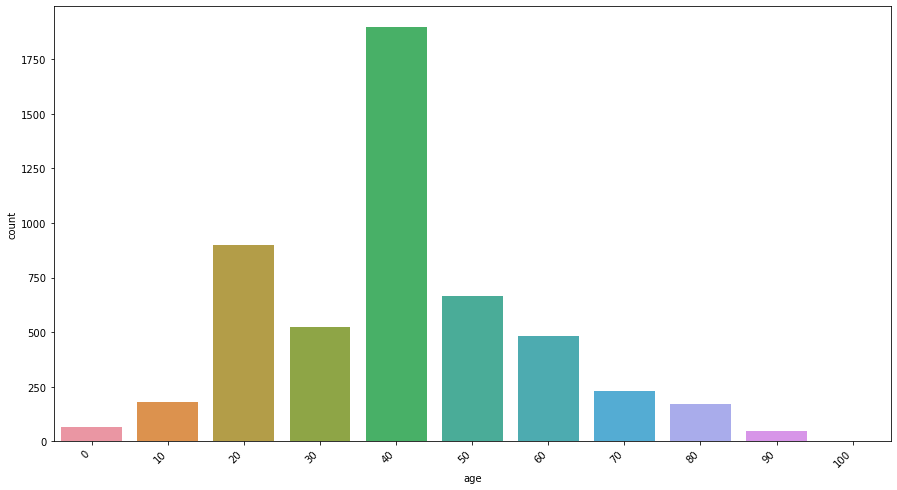

In [60]:
plt.figure(figsize = (15,8))
ax = sns.countplot(p_info['age'], order = p_info['age'].value_counts().sort_index().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

Distributions of deceased, released and isolated patients between the various age groups, indicating for each of the distributions the values corresponding to the quartiles and medians. As can be seen, the median of the deceased corresponds to seventy years, while for the isolated and released it corresponds to forty years. This is easy to explain why the mortality of the virus is greater for older people while, as seen above, the most affected were those of forty, who, however, being younger, have greater resistance to the virus.

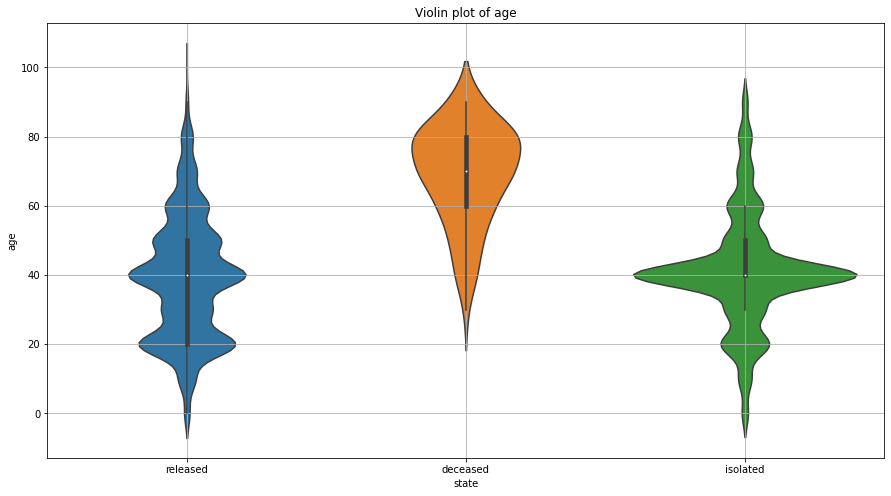

In [77]:
plt.figure(figsize = (15,8))
sns.violinplot(x = 'state', y= 'age', data = p_info, size = 4)
plt.title('Violin plot of age')
plt.grid()
plt.show()

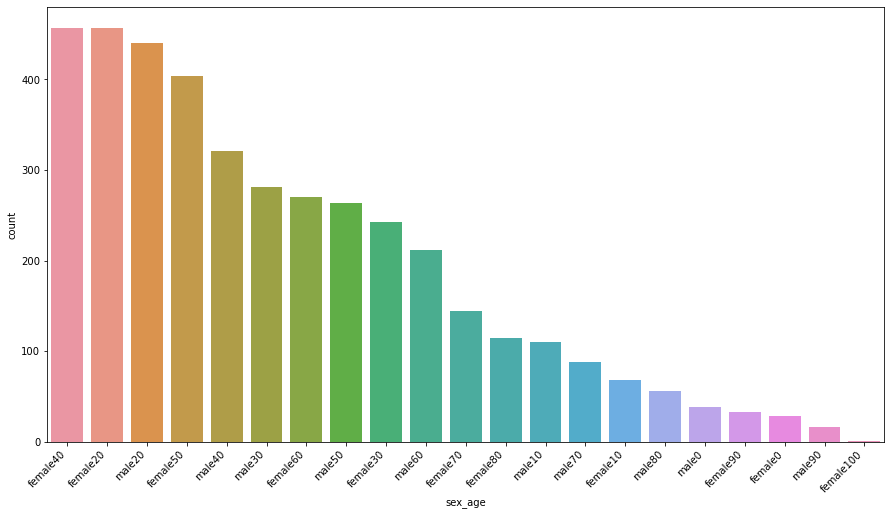

In [62]:
plt.figure(figsize = (15,8))
p_info['sex_age']= p_info['sex'].str.cat((p_info['age']).values.astype(str))
ax = sns.countplot(p_info['sex_age'],
                   order = p_info['sex_age'].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

In this scatterplot, it is shown for each province and each age group whether the largest number of patients died, was isolated or released (based on the color of the various points). It is observed, as it was easy to expect that in the age groups up to fifty years (younger and therefore more resistant to the virus) patients in all the provinces were mainly released or isolated, while in two cases, namely in the in Ulsan in their sixties and in Seoul in their nineties, most patients unfortunately died. To create this scatterplot, the dataset with patient data was taken, ie “p-info”, and in particular its “age”, ”province”, “released”, “deceased” and “isolated” columns.

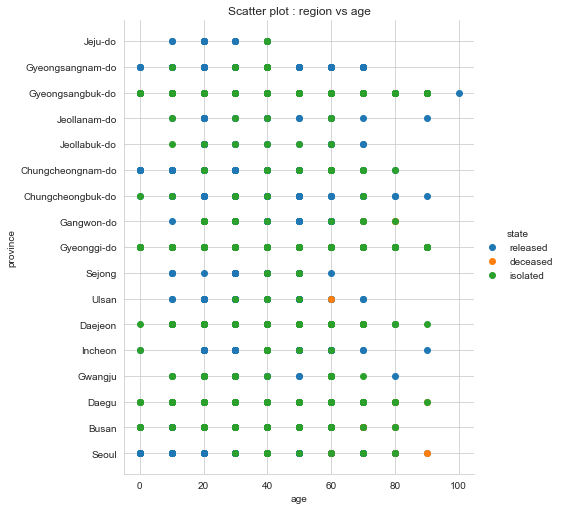

In [80]:
sns.set_style("whitegrid")
sns.FacetGrid(p_info, hue = 'state', size = 7)\
.map(plt.scatter, 'age', 'province')\
.add_legend()
plt.title('Scatter plot : region vs age')
plt.show()

In this violinplot the cases are analyzed according to the country of origin, in particular the distribution of cases in the various age groups by country of origin is shown. The positives originating in Korea cover all age groups of course, but in a similar way almost all age groups are also covered by patients from neighboring China, a country very affected by the virus. There were also many positives among Americans visiting Korea. Finally, Thailand, Bangladesh and Indonesia also appear, even if they cover smaller age groups.

<AxesSubplot:xlabel='age', ylabel='country'>

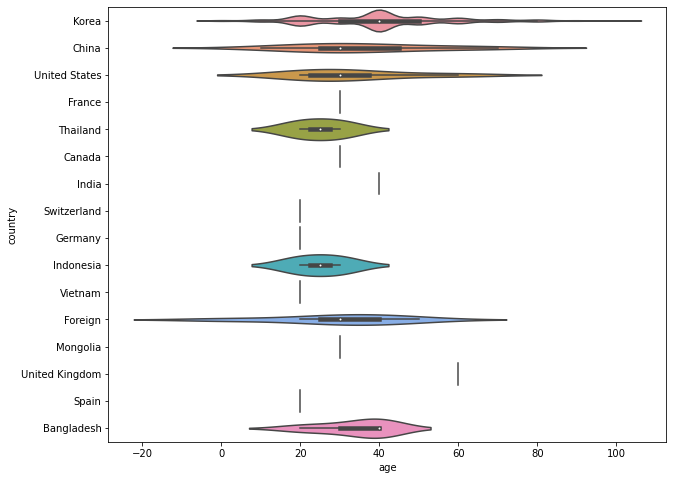

In [63]:
plt.figure(figsize = (10,8))
sns.violinplot('age', 'country', data = p_info)

This histogram shows what were the main causes and the main places where the infection occurred in the country. It is noted that in most cases, around 1600, the infection occurred due to direct contact with the patient, however in around 900 cases the causes are unknown (this confirms the difficulty in tracing the virus and its spread among patients) and more than 800 are due to people from other countries, especially the nearby China where the virus was born, who brought the virus to South Korea.

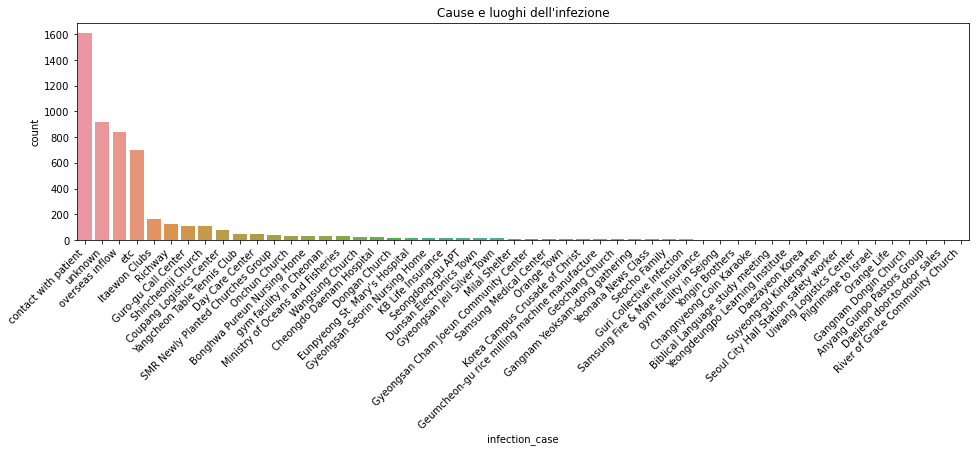

In [64]:
plt.figure(figsize=(16,4))
ax = sns.countplot(p_info['infection_case'],
                   order = p_info['infection_case'].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.title(f"Cause e luoghi dell'infezione")
plt.show()

In [22]:
regional_patient = pd.merge(p_info[['confirmed_date','sex','age','province','city']],
                            region[['province','city','latitude','longitude']], 
                            how = 'inner', on = ['province','city'])
display(regional_patient.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5040 entries, 0 to 5039
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   confirmed_date  5040 non-null   datetime64[ns]
 1   sex             3959 non-null   object        
 2   age             5040 non-null   int32         
 3   province        5040 non-null   object        
 4   city            5040 non-null   object        
 5   latitude        5040 non-null   float64       
 6   longitude       5040 non-null   float64       
dtypes: datetime64[ns](1), float64(2), int32(1), object(3)
memory usage: 295.3+ KB


None

This heat map of South Korea shows the areas of the country that recorded the highest number of infections in the period considered by our dataset. It is observed that most of the infections occurred in the north-western area, where Seoul, the capital, is located, and in the south-eastern area where there are other heavily inhabited provinces. The number of cases that occurred in each area of the map is written inside bubbles with a color that depends on the entity itself, moreover the areas with the greatest contagion are covered by areas in red while those least affected are covered from areas of color tending to blue.

In [23]:
regional_count = regional_patient[['latitude','longitude']]

In [25]:
map_korea = folium.Map([36, 128], zoom_start=7) 

# Filter the DF for rows, then columns
regional_count = regional_patient[['latitude','longitude']]

# List comprehension to make out list of lists
regional_data = [[row['latitude'],row['longitude']] for index, row in regional_count.iterrows()]

# Plot maker
MarkerCluster(regional_data).add_to(map_korea) # Layer 1

# Plot Heat it on the map
HeatMap(regional_data).add_to(map_korea) #Layer 2

# Display the map
map_korea

This latest heat map always shows the number of infections that have occurred in each area of South Korea, but there is a filter where you can choose to view cases based on gender. The “regional-patient” dataset previously obtained was also used to represent this map.

In [26]:
male_patient = regional_patient[regional_patient.sex == 'male'][['latitude','longitude']].dropna() 
#prendiamo solo le righe in "sex" con stritto 'male'

female_patient = regional_patient[regional_patient.sex == 'female'][['latitude','longitude']].dropna()


m = folium.Map([36, 128], zoom_start=7) #creo la mappa 

initial = folium.plugins.MarkerCluster(control=False) # filtro sullo stesso livello della mappa

m.add_child(initial)

female_g = plugins.FeatureGroupSubGroup(initial, 'Female')
m.add_child(female_g)

male_g = plugins.FeatureGroupSubGroup(initial, 'Male') 
m.add_child(male_g)

female_data = [[row['latitude'],row['longitude']] for index, row in female_patient.iterrows()]

male_data = [[row['latitude'],row['longitude']] for index, row in male_patient.iterrows()]

MarkerCluster(female_data).add_to(female_g)

MarkerCluster(male_data).add_to(male_g)

# Plot Heat it on the map
HeatMap(female_data).add_to(female_g) #Layer 2

# Plot Heat it on the map
HeatMap(male_data,gradient={.4: 'purple', .65: 'orange', 1: 'lime'}).add_to(male_g) #Layer 2

folium.LayerControl(collapsed=False).add_to(m)

m

This graph shows the time trends of the cumulative values of the tests, positives and negatives. Obviously, being the percentage of positive tests low compared to negative ones, the trend of positives at first sight seems horizontal, however, looking carefully, we see that there is a growth and this is confirmed by the fact that between the trend of tests and negative there is a deviation corresponding precisely to the positive cases. In a similar way, this graph shows the temporal trends of the cumulative values of the deceased, released and isolated. Here too, since the mortality rate is low, the trend of positives has a slow growth.

In [73]:
# Acc tests
fig=go.Figure()
fig.add_trace((go.Scatter(x=time.index, y=time["test"],
                    mode='lines',
                    name="Acc. tests")))
fig.add_trace((go.Scatter(x=time.index, y=time["negative"],
                    mode='lines',
                    name="Acc. negative tests")))
fig.add_trace((go.Scatter(x=time.index, y=time["confirmed"],
                    mode='lines',
                    name="Acc. positive tests")))
fig.update_layout(title="Accumulated test results over time",
                   xaxis_title="Date",
                   yaxis_title="Count",
                   #yaxis_type="log",
                   template="seaborn")
fig.show()

# Acc cases
fig=go.Figure()
fig.add_trace((go.Scatter(x=time.index, y=time["confirmed"],
                    mode='lines',
                    name="Acc. confirmed")))
fig.add_trace((go.Scatter(x=time.index, y=time["released"],
                    mode='lines',
                    name="Acc. released")))
fig.add_trace((go.Scatter(x=time.index, y=time["deceased"],
                    mode='lines',
                    name="Acc. deceased")))
fig.update_layout(title="Accumulated cases over time",
                   xaxis_title="Date",
                   yaxis_title="Count",
                   #yaxis_type="log",
                   template="seaborn")
fig.show()

In this Gantt chart the various policies desired by the Korean government for the containment of infections have been reported. Each policy is represented as a single process that has a beginning and an end on certain days based on how long that provision has remained in effect. Since the dataset is limited to the period from January to July, all the measures that remained in force after July in the Gantt end in July, since in this analysis the following months are not of interest. Furthermore, since many measures have the same “record”, you can see how these will be on the same line of the Gantt chart even if with different colors to be able to distinguish them. The first measure took place in January and was a first level of alert followed by others in the following months to push the inhabitants to stay at home and to limit social contacts. In February, a special procedure was introduced for those who came from other countries, given the spread of the epidemic in neighboring countries of Asia. In addition, two apps were produced between February and March, one for self-diagnosis and one for self-quarantine. Finally, at the beginning of March there was a first provision for social distancing followed after about 20 days by another more restrictive and subsequently by others. In addition to these, there are other various restrictions that the Korean government wanted to impose to reduce infections such as the obligation to wear masks, the closure of bars and clubs, the closure of schools ... etc.

In [28]:
policy_gantt1 = policy.drop(['country','type'],axis=1)
policy_gantt1.columns=['Task','Detail','Start','Finish'] 
policy_gantt= policy_gantt1.to_dict('records')

fig_gantt = ff.create_gantt(policy_gantt, group_tasks=True, height = 1000, width = 2000)
fig_gantt.show()

In this graph we want to show, after having seen the various containment policies of the Korean government, the result that has been had in terms of infections. In fact, South Korea was one of the first countries in the world to have been affected by the virus, but it was also one of the first to significantly lower the number of infections in a short time, thanks to the measures adopted by the government. Here you can see a graph showing confirmed infections daily divided into three portions of different colors corresponding to the days before the social distancing measures (in green), those following the first and less restrictive distancing started on February 29 (in red) and those subsequent to the second and more restrictive provision which entered into force on March 22 (in blue). As you can see, the first measure was wanted due to the trend of infections that was tending to an exponential trend (the one in green), the result was to significantly slow down the infections, bringing it to a trend that is no longer exponential, albeit still growing ( curve in red), so to finally flatten the curve it was decided to implement a further more restrictive measure, thus obtaining an almost flat curve (the blue one).

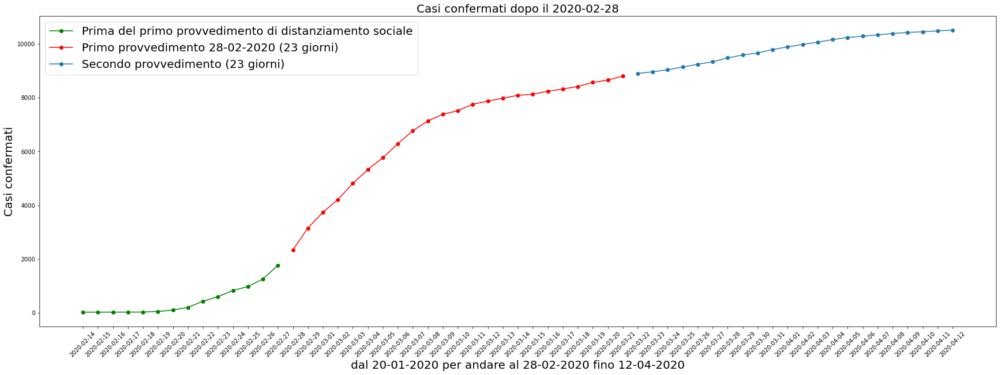

<Figure size 2160x720 with 0 Axes>

In [5]:
date = time['date'] 
conNum = time['confirmed'] 

xbefore=date[25:39] #23 giorni a partire dal 20-01-2020
ybefore=conNum[25:39] 
plt.plot(xbefore, ybefore, marker='o', color='g', label='Prima del primo provvedimento di distanziamento sociale')

xafter1=date[39:62] #23 giorni a partire dal 28-02-2020
yafter1=conNum[39:62] 
plt.plot(xafter1, yafter1, marker='o', color='r', label='Primo provvedimento 28-02-2020 (23 giorni)')


xafter2=date[62:84] #23 giorni dopo l'inizio del primo lockdown
yafter2=conNum[62:84] 
plt.plot(xafter2, yafter2, marker='o', label='Secondo provvedimento (23 giorni)')

plt.xticks(rotation=45)
plt.xlabel("dal 20-01-2020 per andare al 28-02-2020 fino 12-04-2020", fontsize = 20)
plt.ylabel("Casi confermati", fontsize = 20)
plt.title("Casi confermati dopo il 2020-02-28", fontsize = 20)
plt.legend(fontsize = 20)
plt.figure()
plt.show()
plt.rcParams['figure.figsize'] = [30, 10]

## Floating Population
- We will compare ** January 17th (Friday) ** before the first outbreak and ** January 31st (Friday) **. If the value is positive, the floating population has contracted. If the value is negative, many people walk around despite the crown.

In [30]:
def distribuzione_movimenti(date1, date2, city):
    
    if city == 'tutti i distretti di Seoul':        
        # seleziono tutte le righe con quella data
        date_1 = floating[(floating['date'] == pd.to_datetime(date1))] 
        date_2 = floating[(floating['date'] == pd.to_datetime(date2))]
    else:
        # tutte le righe con quella data e città
        date_1 = floating[(floating['date'] == date1) & (floating['city'] == city)] 
        date_2 = floating[(floating['date'] == date2) & (floating['city'] == city)]

    # per ogni ora e per ogni fascia di età vado a fare la somma del numero di persone che fluttuano in Seoul
    
    date_1 = pd.DataFrame(date_1.groupby(['hour', 'birth_year'])['fp_num'].sum()) 
    date_1.reset_index(inplace = True) #faccio il reset dell'indice

    date_2 = pd.DataFrame(date_2.groupby(['hour', 'birth_year'])['fp_num'].sum())
    date_2.reset_index(inplace = True)

    fig, ax = plt.subplots(1,2, figsize = (18,8),  gridspec_kw={'wspace': 0.2})
    
    # le parentesi graffe sono riempite con il valore di city attraverso la .format

    fig.suptitle('{} : Come cambiano le persone in movimento in base alla fascia di età e orario'.format(city), fontsize = 18) 
    fig.subplots_adjust(left=0.001, bottom=0.06, right=1.05, wspace=0.05)

    #creo il plot mettendo come x le ore , y le fascie di età e c il valore dei vari punti, mentre con s setto la grandezza del punto, cmap il colore
    
    t = ax[0].scatter(x=date_1['hour'], y=date_1['birth_year'], c=date_1['fp_num'], s= 200, cmap=plt.cm.RdYlBu_r)
    ax[0].set_title("{}".format(date1), fontsize=15)
    ax[0].set_xlabel('hour', fontsize=13)
    ax[0].set_ylabel('birth_year', fontsize=13)    
    cbar0  =plt.colorbar(t, ax = ax[0])
    cbar0.set_label('fp_num', fontsize=13)

    t2 = ax[1].scatter(x=date_2['hour'], y=date_2['birth_year'], c=date_2['fp_num'], s= 200, cmap=plt.cm.RdYlBu_r)
    ax[1].set_title("{}".format(date2), fontsize=15)
    ax[1].set_xlabel('hour', fontsize=13)
    ax[1].set_ylabel('birth_year', fontsize=13)    
    cbar1  = plt.colorbar(t2, ax = ax[1])
    cbar1.set_label('fp_num', fontsize=13)        
    plt.show()

In [31]:
def distribuzione_movimenti_diff(date1, date2, city):
    
    if city == 'tutti i distretti di Seoul':    
        # seleziono tutte le righe con quella data    
        date_1 = floating[(floating['date'] == pd.to_datetime(date1))]
        date_2 = floating[(floating['date'] == pd.to_datetime(date2))]
    else:
        # tutte le righe con quella data e città
        date_1 = floating[(floating['date'] == pd.to_datetime(date1)) & (floating['city'] == city)]
        date_2 = floating[(floating['date'] == pd.to_datetime(date2)) & (floating['city'] == city)]

    # per ogni ora vado a fare la somma del numero di persone che fluttuano in Seoul

    date_1_no_groupby = pd.DataFrame(date_1.groupby(['hour'])['fp_num'].sum())
    date_1_no_groupby.reset_index(inplace = True)

    date_2_no_groupby = pd.DataFrame(date_2.groupby(['hour'])['fp_num'].sum())
    date_2_no_groupby.reset_index(inplace = True)
    
     # per ogni ora e per ogni fascia di età vado a fare la somma del numero di persone che fluttuano in Seoul

    date_1_groupby = pd.DataFrame(date_1.groupby(['hour', 'birth_year'])['fp_num'].sum())
    date_1_groupby.reset_index(inplace = True)

    date_2_groupby = pd.DataFrame(date_2.groupby(['hour', 'birth_year'])['fp_num'].sum())
    date_2_groupby.reset_index(inplace = True)
    
    fp_num_diff = date_1_groupby.iloc[:,-1:] -  date_2_groupby.iloc[:,-1:] #seleziono tutte le righe e l'ultima colonna "-1:"
    ora_eta = date_1_groupby.iloc[:,:-1] # prendo tutte tranne l'ultima colonna
    df = pd.concat([ora_eta, fp_num_diff ], axis = 1) # concateno il dataframe ora_eta con la serie fp_num_diff
        
    fig, ax = plt.subplots(1,2, figsize = (18,8),  gridspec_kw={'wspace': 0.2, 'hspace': 0.4})
    # le parentesi graffe sono riempite con il valore di city attraverso la .format
    fig.suptitle('{} : Differenza tra prima del covid e dopo il covid'.format(city), fontsize = 18)
    fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, wspace=0.05)

    # creo il plot mettendo come x le ore , y le fascie di età e c il valore dei vari punti, 
    # mentre con s setto la grandezza del punto, cmap il colore
    
    t = ax[0].scatter(x=df['hour'], y=df['birth_year'], c=df['fp_num'], s= 200, cmap=plt.cm.RdYlBu_r, vmax =7000)
    ax[0].set_title("{} -- {} differenza tra le due date, divise per ora e età".format(date1, date2), fontsize=15)
    ax[0].set_xlabel('hour', fontsize=13)
    ax[0].set_ylabel('birth_year', fontsize=13)    
    cbar1 = plt.colorbar(t, ax = ax[0])
    cbar1.set_label('fp_num', fontsize=13)

    #plot lineare della somma delle persone che fluttuano per i distretti di Seoul raggruppati per ora
    
    sns.lineplot(data=date_1_no_groupby, x='hour', y='fp_num', color='green', ax=ax[1]).set_title('fp_num', fontsize=16)
    sns.lineplot(data=date_2_no_groupby, x='hour', y='fp_num', color='purple', ax=ax[1]).set_title('fp_num', fontsize=16)
    ax[1].set_title("spostamenti delle persone nelle date {} e {}".format(date1, date2), fontsize=15)
    ax[1].set_xlabel('hour', fontsize=13)
    ax[1].set_ylabel('total fp_num', fontsize=13)    
    ax[1].legend([date1, date2])
    plt.show()

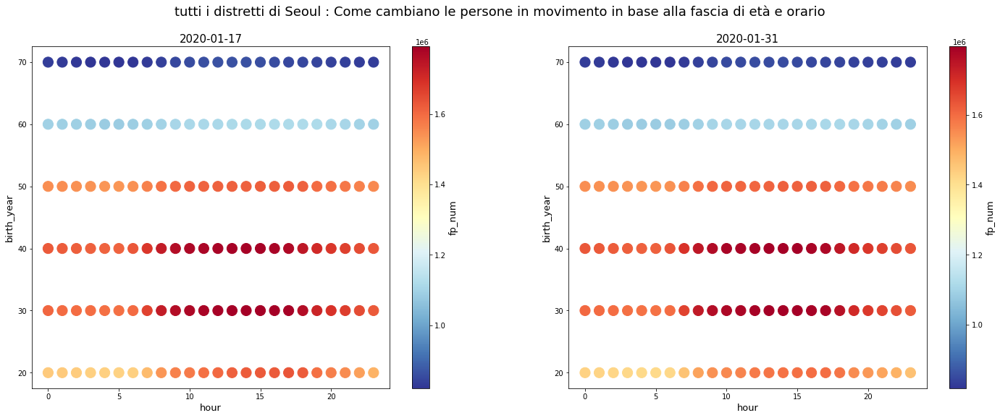

In [32]:
distribuzione_movimenti('2020-01-17', '2020-01-31', 'tutti i distretti di Seoul')

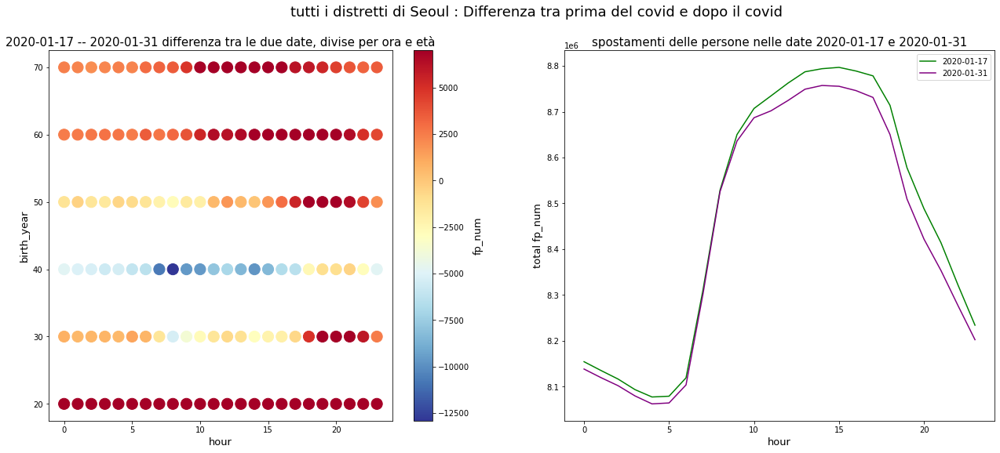

In [33]:
distribuzione_movimenti_diff('2020-01-17', '2020-01-31', 'tutti i distretti di Seoul')

> Andiamo a vedere l'andamento della popolazione che circolava nella città di Seoul prima del virus nel **2020-01-17** e dopo il primo provvedimento di distanziamento sociale avvenuto il **2020-03-01**.

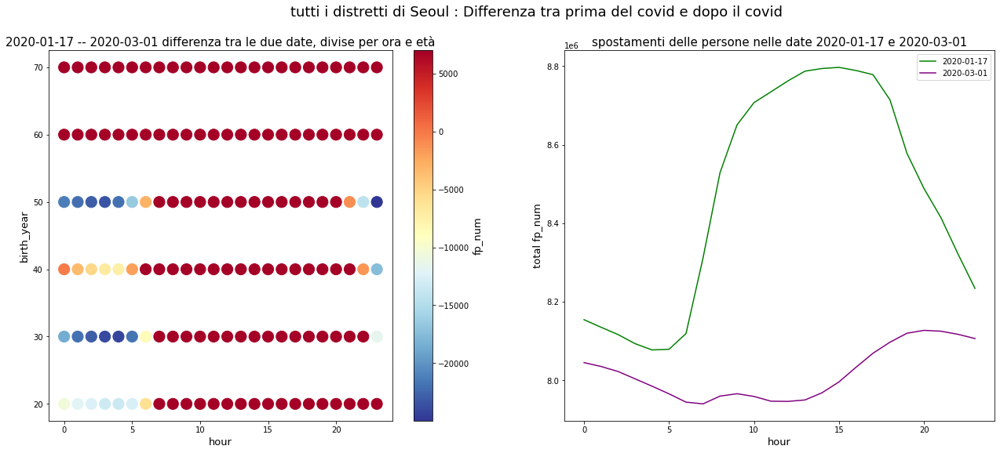

In [34]:
distribuzione_movimenti_diff('2020-01-17', '2020-03-01', 'tutti i distretti di Seoul')

In this scatterplot instead we wanted to show how many cases there were based on sex and age group, therefore each bubble represents individuals of that sex and that age and the size of the bubbles is proportional to the total number of people with those values. The color of the bubbles is based on a gradient based on the total number of cases of interest. It is observed that among the females the most infected age groups were those of the forties and the twenties, both with 457 total cases, while among the males they are the twenty-year-olds with a total of 440 cases.

In [27]:
p_info['freq_age']=0
ages=p_info['age'].value_counts()

for i in ages.index:
    for j in ['male', 'female']:
        p_info.freq_age[(p_info.age==i)&(p_info.sex==j)]=len(p_info[(p_info.age==i)&(p_info.sex==j)])

fig = px.scatter(p_info, x="age", y="sex",
	         size="freq_age", color="freq_age",
                 hover_name="country", log_x=False, size_max=60)
fig.show()

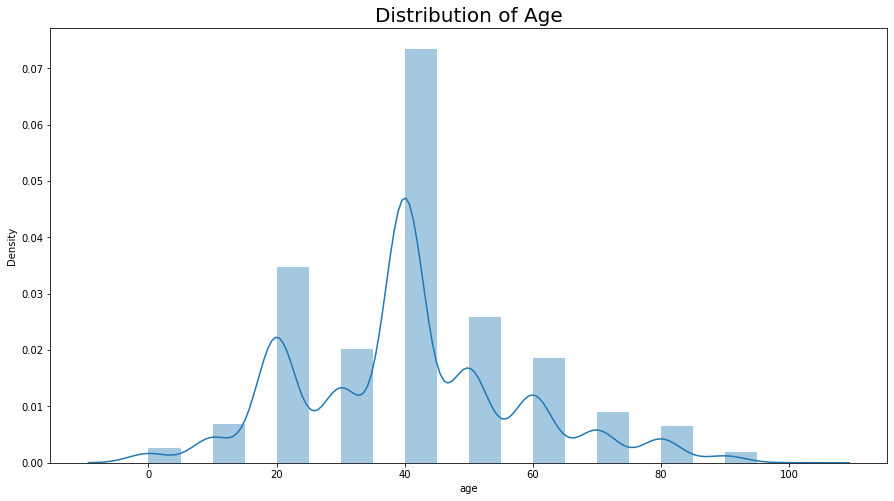

In [28]:
#vedo più nel dettaglio la distribuzione dell'età ora
plt.figure(figsize=(15,8))
sns.distplot(p_info.age, kde=True, bins=20)
plt.title('Distribution of Age', fontsize = 20)
plt.show()  #tendo a avere clienti giovani

The infections that have occurred by age group and by province are displayed, so each bubble represents the individuals of that province and of that age and the size of the bubbles is proportional to the total number of people with those values. The color of the bubbles is based on a gradient based on the total number of cases of interest. Focusing on the three Korean provinces most affected by the pandemic, namely Seoul, Gyeonggi-do and Gyeonsangbuk-do, it can be seen that the first two confirm the national data, that is, there have been more infections among the forties and in general in the intermediate ages, on the other hand, Gyeonsangbuk-do differs a little in which most of the infections occurred among the twenty-year-olds (309 cases).

In [29]:
provv=p_info.province.unique().tolist()
for i in ages.index:
    for j in provv:
        p_info.freq_age[(p_info.age==i)&(p_info.province==j)]=len(p_info[(p_info.age==i)&(p_info.province==j)])

fig = px.scatter(p_info, x="age", y="province",size="freq_age", color="freq_age",hover_name="country", log_x=False, size_max=30)
fig.show()

This radar chart shows the mortality rate that occurred by age group in South Korea. This graphical representation consists of a sequence of rays that originate from a center and form equal angles to each other and gives us a mortality index. of the Korean population among those infected with Covid-19; each ray represents one of the variables. The distance from the center of the point marked on the ray is proportional to the value of the variable with respect to the maximum achievable value. The points on the rays are joined with segments, so that the graph is shaped like a star or a spider web. As can be seen, mortality is 0 \% up to the age of 20 and begins to progressively rise with increasing age, up to $ 14.29 \% $ in the age group of eighty. A particular case is the age group of the centenarians which includes only one sample, that is, a single infected person who, however, fortunately is cured, so the death rate for centennials is 0 \%. The mortality rate was calculated through the percentage of people who died compared to the total number of infected people of each specific age.

In [30]:
#indice di mortalità
p_info['age_death']=0
for i in ages.index:
    p_info.age_death[(p_info.age==i)]=round(100*len(p_info.age_death[(p_info.age==i)&(p_info.state=='deceased')])/len(p_info.age_death[(p_info.age==i)]),2)
p_info["age_death"]=p_info["age_death"].astype(str)
p_info["age_death"]=p_info["age_death"]+'%'

mort=[]
et=[]
eta=ages.index.tolist()
eta.sort()
for i in eta:
    mort.append(p_info.age_death[p_info.age==i].unique()[0])
    et.append(i)
    
fig = px.line_polar(r=et, theta=mort, line_close=True)
fig.update_traces(fill='toself')
fig.show()


Finally, this histogram shows for each province the number of patients released, isolated and who died in the time span covered by the dataset considered. Each bar is divided into 3 overlapping bars of different colors (according to the legend) which indicate the number of patients released, isolated and died in that province. It is noted that the province that had the greatest number of deaths was clearly Gyeonsangbuk-do, while the province that had the greatest number of isolated patients was certainly Gyeonggi-do. Finally, it is noted that while in Seoul and Gyeonsangbuk-do there are many more patients released than isolated and deceased, in Gyeonggi-do the majority of patients have been placed in isolation.

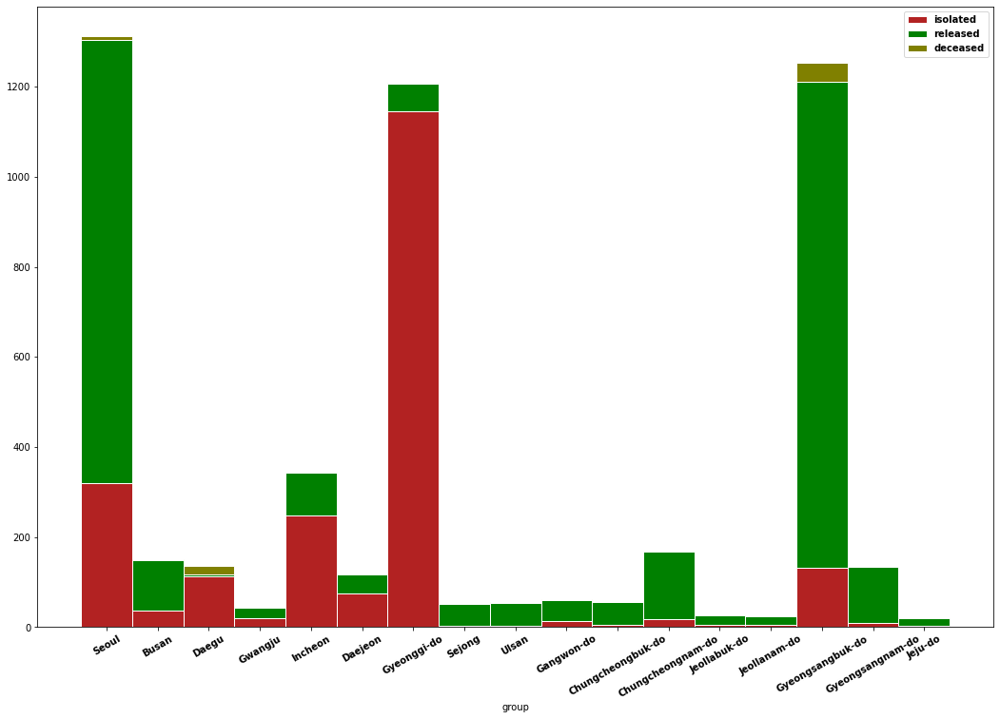

In [31]:
from matplotlib import rc
 
isolated=[]
deceased=[]
released=[]
for i in provv:
    isolated.append(len(p_info[(p_info.province==i)&(p_info.state=='isolated')]))
    deceased.append(len(p_info[(p_info.province==i)&(p_info.state=='deceased')]))
    released.append(len(p_info[(p_info.province==i)&(p_info.state=='released')]))    
    
f, ax = plt.subplots(figsize=(18,12))  
# y-axis in bold
rc('font', weight='bold')
 
# Values of each group
bars1 = isolated
bars2 = released
bars3 = deceased
 
# Heights of bars1 + bars2
bars = np.add(bars1, bars2).tolist()
 
# The position of the bars on the x-axis
r = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16]
 
# Names of group and bar width
names = provv
barWidth = 1
 
# Create brown bars
plt.bar(r, bars1, color='firebrick', edgecolor='white', width=barWidth)
# Create green bars (middle), on top of the firs ones
plt.bar(r, bars2, bottom=bars1, color='green', edgecolor='white', width=barWidth)
# Create green bars (top)
plt.bar(r, bars3, bottom=bars, color='olive', edgecolor='white', width=barWidth)

#for p in ax.patches:
#             ax.annotate("%.2f" % p.get_height(), (p.get_x() + p.get_width() / 2., p.get_height()),
#                 ha='center', va='center', fontsize=11, color='black', xytext=(0, 20),
#                 textcoords='offset points')
 
# Custom X axis
plt.xticks(r, names, fontweight='bold',rotation=30)
plt.xlabel("group")
plt.legend(['isolated','released','deceased'])
# Show graphic
plt.show()


# Relationship analysis between variables

With this pairplot we want to observe the reciprocal relationships between the percentage of elderly, lonely elderly and the number of retirement homes in each city. This is useful in order to have an idea of how the elderly population is distributed in the country, that is, the part most at risk and with the highest mortality from Covid-19. Each point corresponds to a city. It is noted that between the percentages of elderly and lonely elderly there is a relationship that appears to be linear, that is, as one grows, the other also grows according to a coefficient of proportionality. On the other hand, in the relationship between the percentages of lonely and elderly elderly people and the number of retirement homes, it is noted that there are few cities with low percentages of elderly people and a large number of retirement homes. These are large cities, such as Seoul, which despite having a low average age have numerous facilities for the elderly. On the other hand, cities with a low number of facilities for the elderly are probably smaller cities.

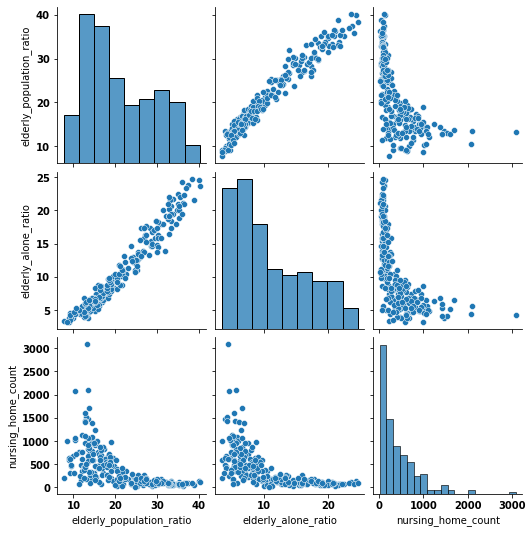

In [32]:
#non sono significative le colonne e righe relative a nursing_home_count perchè non abbiamo un modo 
#per calcolare il numero di abitanti di ogni città
region_drop=region[(region.province==region.city) & (region.province!= 'Jeju-do') & (region.province!= 'Sejong')]
region.drop(region_drop.index.tolist(), inplace=True)

sns.pairplot(region[["elderly_population_ratio","elderly_alone_ratio","nursing_home_count"]]) 

In [33]:
trend_time = pd.merge(search[['cold','flu','pneumonia','coronavirus','date']],
                            time[['date','test','confirmed','deceased']], 
                            how = 'inner', on = ['date'])
display(trend_time.head())

,cold,flu,pneumonia,coronavirus,date,test,confirmed,deceased
0,0.19217,0.70343,3.63716,20.69610,2020-01-20,1,1,0
1,0.22462,0.59789,4.31987,35.33284,2020-01-21,1,1,0
2,0.23808,0.56661,3.66416,29.74474,2020-01-22,4,1,0
3,0.30308,0.55625,3.18035,100.00000,2020-01-23,22,1,0
4,0.34689,0.40226,2.48156,86.11541,2020-01-24,27,2,0


In this second pairplot we wanted to visualize the relationships between the number of internet searches for the words "coronavirus", "flu", "pneumonia" and "cold". It is observed that in all the relationships between the searches for "flu", "pneumonia" and "cold" with those of "coronavirus" one or more almost linear increasing trends can be identified. This means that with the growth of those researches, research regarding the coronavirus has also grown, this probably due to the similarity of the symptoms of Covid with those various diseases. The data used to make this pairplot was taken from the internet search dataset “search”.

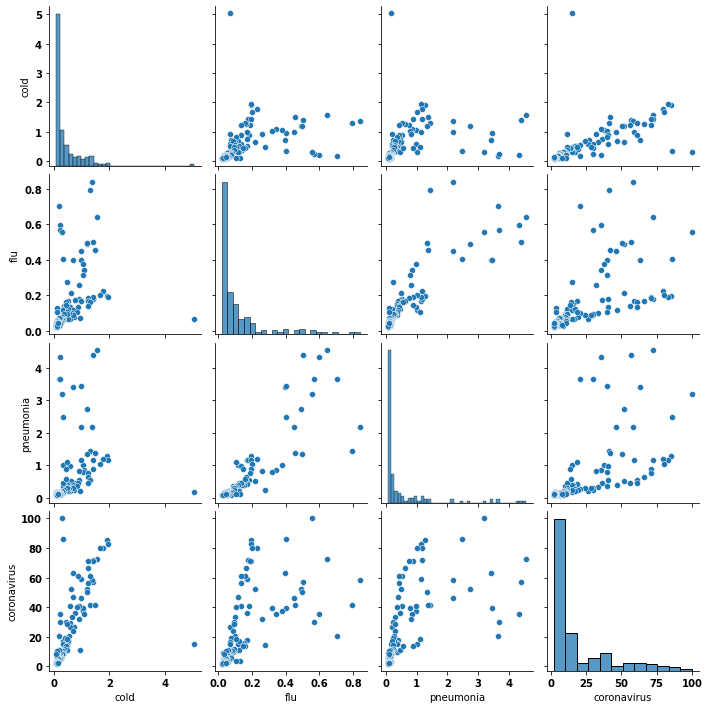

In [34]:
sns.pairplot(trend_time[['cold','flu','pneumonia','coronavirus']]) 

This correlation matrix shows the various correlations between the searches for “flu”, “pneumonia”, “cold” and “coronavirus”, with a color scale based on the value of the correlation between the variables. There is a very high correlation between research on flu and prehumonia, equal to 0.87 and correlations of more than 0.6 between research on the coronavirus and research on the other three diseases. This means that often those who have sought information about Covid-19 have also sought information on these other related diseases. The data used to make this pairplot was taken from the internet search dataset “search”.

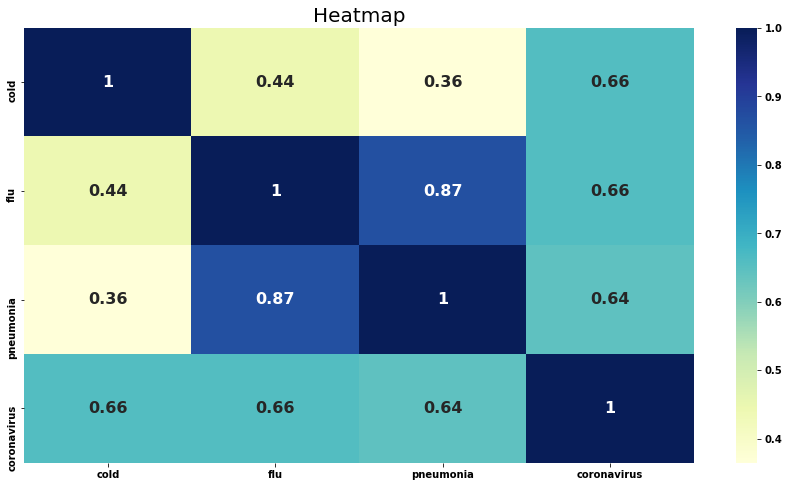

In [35]:
plt.figure(figsize=(15,8))
sns.heatmap(trend_time[['cold','flu','pneumonia','coronavirus']].corr(), cmap = 'YlGnBu', annot = True, annot_kws={"fontsize": 16}) 
plt.title('Heatmap', fontsize = 20)
plt.show()

In [36]:
trend_time["test_g"]=1
trend_time["confirmed_g"]=1
trend_time["deceased_g"]=0
for i in trend_time.index:
    if i!=0:
        trend_time["test_g"].loc[i]=trend_time["test"].loc[i]-trend_time["test"].loc[i-1]
        trend_time["confirmed_g"].loc[i]=trend_time["confirmed"].loc[i]-trend_time["confirmed"].loc[i-1]
        trend_time["deceased_g"].loc[i]=trend_time["deceased"].loc[i]-trend_time["deceased"].loc[i-1]

trend_time.head()

,cold,flu,pneumonia,coronavirus,date,test,confirmed,deceased,test_g,confirmed_g,deceased_g
0,0.19217,0.70343,3.63716,20.69610,2020-01-20,1,1,0,1,1,0
1,0.22462,0.59789,4.31987,35.33284,2020-01-21,1,1,0,0,0,0
2,0.23808,0.56661,3.66416,29.74474,2020-01-22,4,1,0,3,0,0
3,0.30308,0.55625,3.18035,100.00000,2020-01-23,22,1,0,18,0,0
4,0.34689,0.40226,2.48156,86.11541,2020-01-24,27,2,0,5,1,0


In this pairplot we wanted to visualize the relationships between searches for the word “coronavirus” and the positives and daily tests. To better visualize the areas with greater density of points, level lines were used. It is observed that in most days there were not yet infected but there were still research on the coronavirus, this is due to the fact that the "search" dataset contains all the searches from 2016. Then there were days with a lot of research and few infections, probably corresponding to the beginning of the pandemic, in which many inquired about the new virus that had first hit neighboring China. Finally, there have been days with medium research and many infections, probably corresponding to the peak of the pandemic in South Korea. As for the tests, there have been many days with little research on the coronavirus but with many tests, probably corresponding to the end of the pandemic. The data used to create this pairplot were obtained from the "trend-time" dataset obtained by merging the "cold", "flu", "pneumonia", "coronavirus" and "date" columns of the "search" dataset and the "Date", "test", "confirmed" and "deceased" of the "time" dataset to which the columns containing the infections, tests and daily deaths have been added.

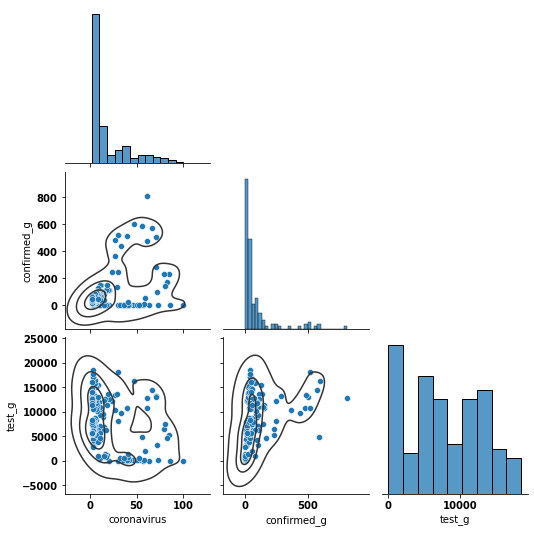

In [37]:
g=sns.pairplot(trend_time[['coronavirus','confirmed_g','test_g']],corner=True) 
g.map_lower(sns.kdeplot, levels=4, color=".2")

This correlation matrix shows the various correlations between searches for the word “coronavirus”, daily positives and daily tests. It is observed that there are no high correlations and the greatest are between daily positives and searches for the word “coronavirus” (0.41) and between daily tests and daily positives (0.35).

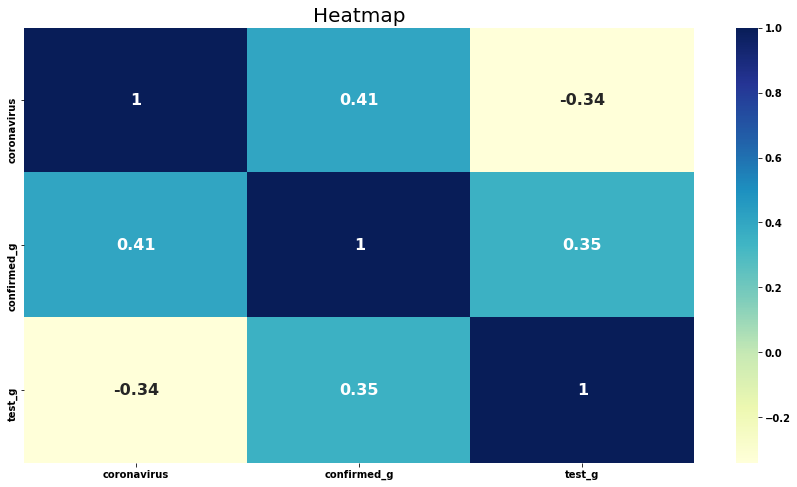

In [38]:
plt.figure(figsize=(15,8))
sns.heatmap(trend_time[['coronavirus','confirmed_g','test_g']].corr(), cmap = 'YlGnBu', annot = True, annot_kws={"fontsize": 16}) 
plt.title('Heatmap', fontsize = 20)
plt.show()

In [39]:
floating.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1084800 entries, 0 to 1084799
Data columns (total 7 columns):
 #   Column      Non-Null Count    Dtype         
---  ------      --------------    -----         
 0   date        1084800 non-null  datetime64[ns]
 1   hour        1084800 non-null  int64         
 2   birth_year  1084800 non-null  int64         
 3   sex         1084800 non-null  object        
 4   province    1084800 non-null  object        
 5   city        1084800 non-null  object        
 6   fp_num      1084800 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(3)
memory usage: 57.9+ MB


In [40]:
trend_time.date

0     2020-01-20
1     2020-01-21
2     2020-01-22
3     2020-01-23
4     2020-01-24
         ...    
157   2020-06-25
158   2020-06-26
159   2020-06-27
160   2020-06-28
161   2020-06-29
Name: date, Length: 162, dtype: datetime64[ns]

In [41]:
floating_ragg=floating.groupby(by='date',as_index=False).sum()

In [42]:
floating_ragg.drop(['hour','birth_year'], axis=1, inplace=True)

In [43]:
floating_ragg.head()
floating_ragg.tail()

,date,fp_num
146,2020-05-27,199293080
147,2020-05-28,199209840
148,2020-05-29,140847320
149,2020-05-30,189674150
150,2020-05-31,188346500


In [44]:
time_seoul= t_province[t_province.province=='Seoul']

In [45]:
time_seoul.drop(['time','province'], axis=1, inplace=True)

In [46]:
time_seoul.head()

,date,confirmed,released,deceased
0,2020-01-20,0,0,0
17,2020-01-21,0,0,0
34,2020-01-22,0,0,0
51,2020-01-23,0,0,0
68,2020-01-24,0,0,0


In [47]:
time_seoul["confirmed_g"]=0
time_seoul["released_g"]=0
time_seoul["deceased_g"]=0
for i in time_seoul.index:
    if i!=0:
        time_seoul["confirmed_g"].loc[i]=time_seoul["confirmed"].loc[i]-time_seoul["confirmed"].loc[i-17]
        time_seoul["released_g"].loc[i]=time_seoul["released"].loc[i]-time_seoul["released"].loc[i-17]
        time_seoul["deceased_g"].loc[i]=time_seoul["deceased"].loc[i]-time_seoul["deceased"].loc[i-17]
time_seoul.drop(['confirmed','released','deceased'], axis=1, inplace=True)
time_seoul.info()
time_seoul.tail()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 163 entries, 0 to 2754
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         163 non-null    datetime64[ns]
 1   confirmed_g  163 non-null    int64         
 2   released_g   163 non-null    int64         
 3   deceased_g   163 non-null    int64         
dtypes: datetime64[ns](1), int64(3)
memory usage: 11.4 KB


,date,confirmed_g,released_g,deceased_g
2686,2020-06-26,17,82,0
2703,2020-06-27,17,68,0
2720,2020-06-28,14,12,0
2737,2020-06-29,7,19,0
2754,2020-06-30,7,43,0


In [48]:
seoul_info = pd.merge(floating_ragg,
                            time_seoul, 
                            how = 'inner', on = ['date'])
seoul_info.head()


,date,fp_num,confirmed_g,released_g,deceased_g
0,2020-01-20,203217220,0,0,0
1,2020-01-21,203095360,0,0,0
2,2020-01-22,202391580,0,0,0
3,2020-01-23,196953190,0,0,0
4,2020-01-24,176114510,0,0,0


In this pairplot we wanted to visualize the relationships between the movements of people, positives and released patients. The “seoul-info” dataset was used, obtained with merge, drop and groupby operations from the “floating” and “t-province” datasets. Observing in particular the relationship between positives and daily discharged patients, it is noted that there were few days with many discharged and few positives, probably towards the end of the pandemic, while there were a few days with few discharged and many positives, probably corresponding to the beginning of the pandemic.

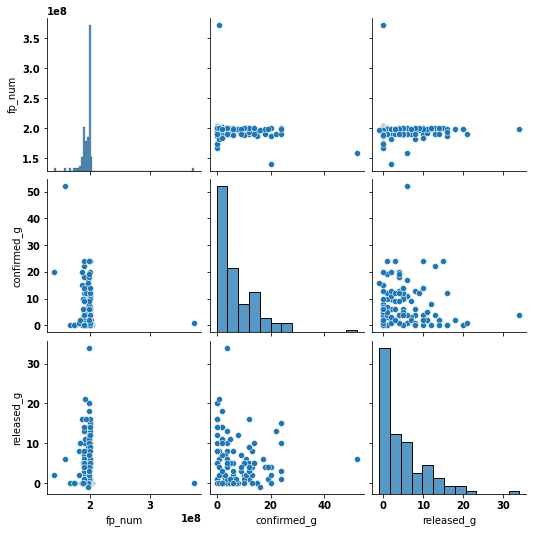

In [49]:
sns.pairplot(seoul_info.drop(['deceased_g'], axis=1)) 

Analyzing through a correlation matrix the various correlations between movements of people, positives, patients released daily and daily deaths, it can be seen that there are very low correlations in this case

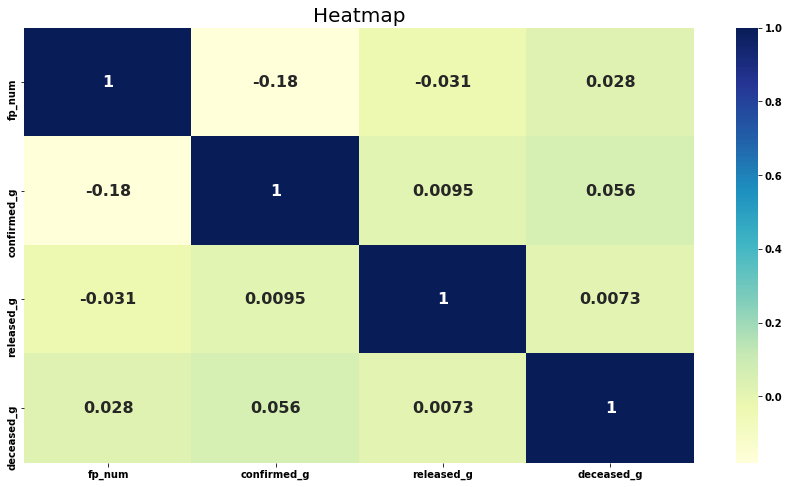

In [50]:
plt.figure(figsize=(15,8))
sns.heatmap(seoul_info.corr(), cmap = 'YlGnBu', annot = True, annot_kws={"fontsize": 16}) 
plt.title('Heatmap', fontsize = 20)
plt.show()

In [51]:
x = trend_time[['flu','coronavirus']].values

# let's check the shape of x
print(x.shape)

(162, 2)


# Sklearn Analysis

After having done a descriptive analysis using the available datasets, we now want to find interesting clusters in which to divide the data. As the first clustering method, k-means is considered, where k represents the number of clusters to identify. To find this k, the Elbow method was used, which is a graphic method that allows you to choose the optimal k value. The variables considered are the research on coronavirus and influenza. Once the graph of the underlying inertia is obtained, the k is considered for which there is the last significant variation in slope. In this case, k = 3 was chosen.

Text(0, 0.5, 'wcss')

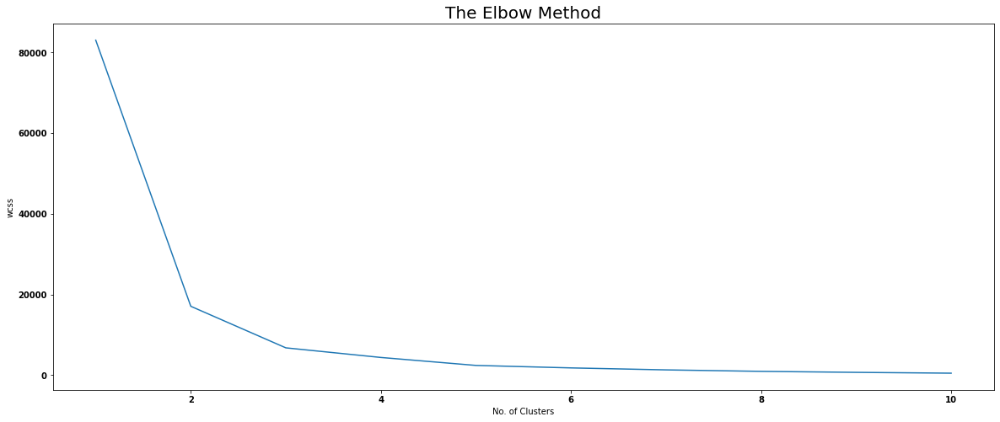

In [52]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(x)
    wcss.append(km.inertia_)

plt.figure(figsize=(20,8))
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')

Using the value of k calculated above (3) we can therefore find the k clusters. Each cluster has a different color associated with it. The yellow cluster corresponds to the days with little research on coronavirus and influenza, the teal one contains the days with intermediate research levels and finally the pink one indicates high research levels. Probably the days with the most research are those of the beginning of the pandemic in which almost nothing was known about the virus and many wanted to inform themselves about it, instead those with little research probably correspond to the end of the period of maximum spread of the virus in Korea , in which by now a large part of the population had already informed themselves previously. The centers of the various clusters obtained are represented in blue.

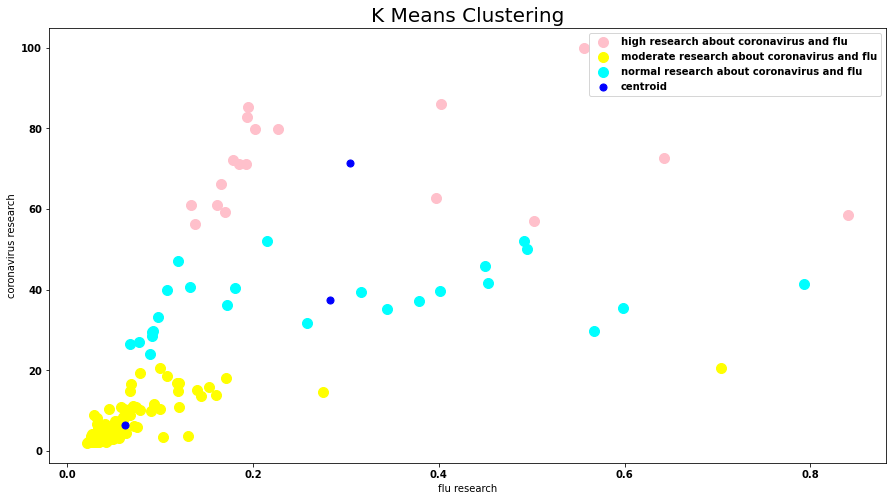

In [53]:
km = KMeans(n_clusters = 3, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.figure(figsize=(15,8))
plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'high research about coronavirus and flu')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'moderate research about coronavirus and flu')
plt.scatter(x[y_means == 2, 0], x[y_means == 2, 1], s = 100, c = 'cyan', label = 'normal research about coronavirus and flu')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centroid')

plt.title('K Means Clustering', fontsize = 20)
plt.xlabel('flu research')
plt.ylabel('coronavirus research')
plt.legend()
plt.show()

After using the first method for clustering, a further method was continued, namely that of hierarchical clustering. Always using the same variables and the same value of k, the results obtained by applying this second technique are equivalent to those obtained with the previous method.

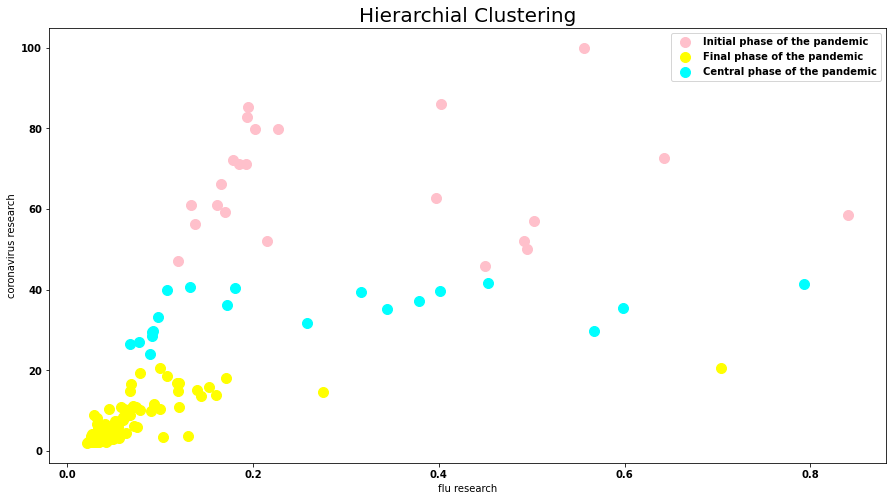

In [54]:
from sklearn.cluster import AgglomerativeClustering

hc = AgglomerativeClustering(n_clusters = 3, affinity = 'euclidean', linkage = 'ward')
y_hc = hc.fit_predict(x)

plt.figure(figsize=(15,8))
plt.scatter(x[y_hc == 0, 0], x[y_hc == 0, 1], s = 100, c = 'pink', label = 'Initial phase of the pandemic')
plt.scatter(x[y_hc == 1, 0], x[y_hc == 1, 1], s = 100, c = 'yellow', label = 'Final phase of the pandemic')
plt.scatter(x[y_hc == 2, 0], x[y_hc == 2, 1], s = 100, c = 'cyan', label = 'Central phase of the pandemic')

plt.title('Hierarchial Clustering', fontsize = 20)
plt.xlabel('flu research')
plt.ylabel('coronavirus research')
plt.legend()
plt.show()


In [55]:
x = trend_time[['test_g','coronavirus']].values

# let's check the shape of x
print(x.shape)

(162, 2)


A second division into clusters can then be carried out between research on the coronavirus and daily tests. First, as in the previous case, we consider the k-means method. To find k, the Elbow method is used as before. Once the graph of the underlying inertia is obtained, the k is considered for which there is the last significant variation in slope. We chose k = 3 also in this case.

Text(0, 0.5, 'wcss')

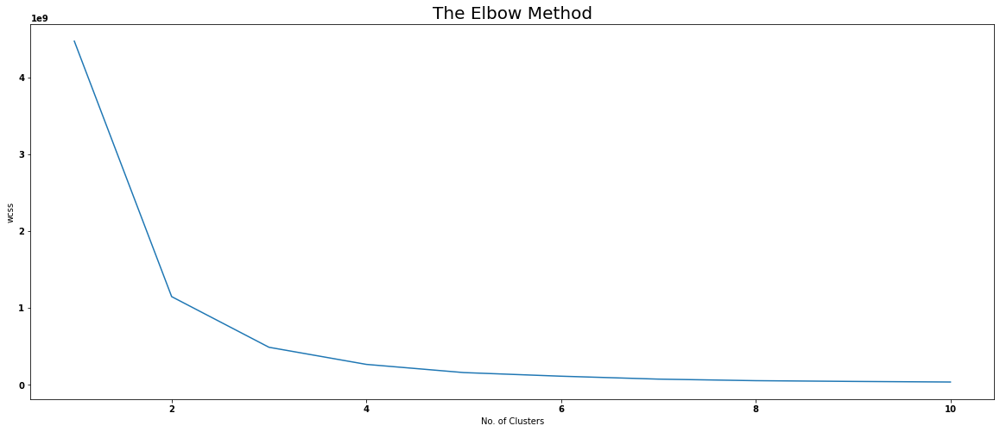

In [56]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(x)
    wcss.append(km.inertia_)

plt.figure(figsize=(20,8))
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')

Using the value of k calculated above (3) we can therefore find the k clusters. Each cluster has a different color associated with it. The pink cluster on the left includes days with few daily tests, so they are probably days at the beginning of the pandemic (when there was little testing and there was presumably a lot of research on the virus) and at the end of the pandemic (when there was presumably little research on the virus and few tests). The teal cluster, on the other hand, includes the days with an average number of tests, probably in the second phase of the pandemic, and finally the yellow cluster, with many daily tests, probably corresponds to the central phase of the pandemic, close to the peak, in which many tests were done and in which less research on the virus was done on average. The centers of the various clusters obtained are represented in blue.

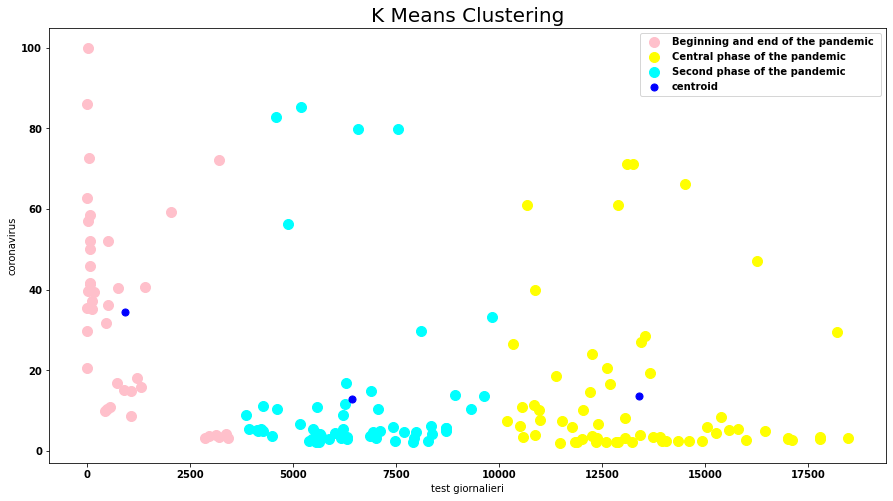

In [57]:
km = KMeans(n_clusters = 3, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.figure(figsize=(15,8))
plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Beginning and end of the pandemic ')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'Central phase of the pandemic')
plt.scatter(x[y_means == 2, 0], x[y_means == 2, 1], s = 100, c = 'cyan', label = 'Second phase of the pandemic')


plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centroid')

plt.title('K Means Clustering', fontsize = 20)
plt.xlabel('test giornalieri')
plt.ylabel('coronavirus')
plt.legend()
plt.show()

To confirm the results obtained with the previous techniques, the yellowbrick library was used. By reapplying the kmeans technique through this library, we again obtain that the optimal k value is 3.

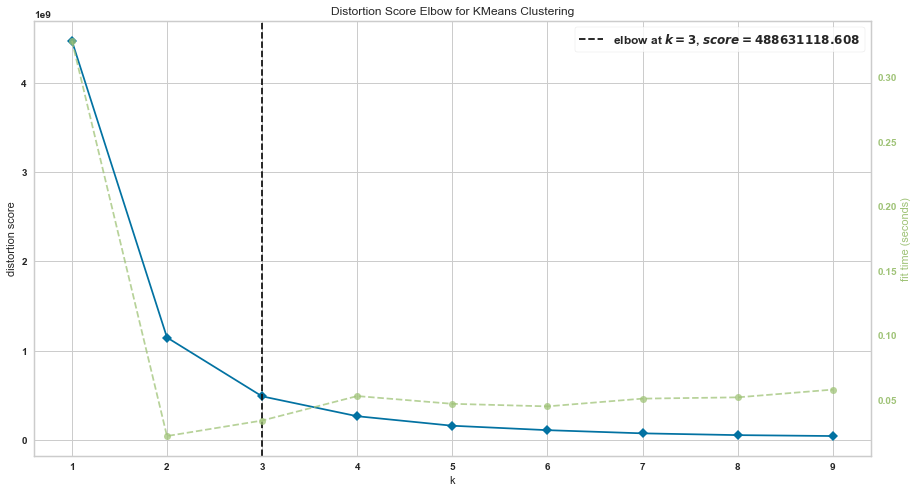

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [58]:
from yellowbrick.cluster import KElbowVisualizer

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10))

plt.figure(figsize=(15,8))
visualizer.fit(x)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

To visualize the goodness of the clusters thus obtained, the visualization of silhouettes was used. It is observed that all three silhouettes, representing the three clusters obtained, cross the vertical dotted line and there are no samples with a negative silhouette, which indicates a good division into clusters.

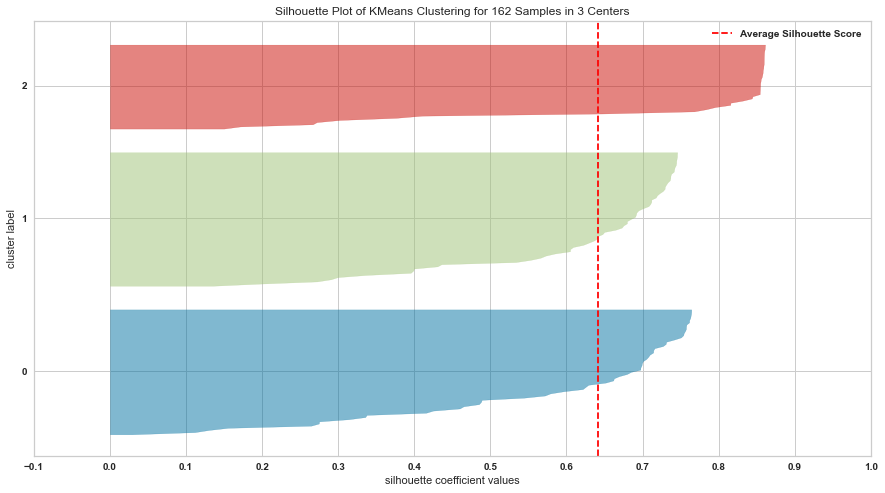

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 162 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [59]:
from yellowbrick.cluster import SilhouetteVisualizer


# Instantiate the clustering model and visualizer
model = KMeans(3, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

plt.figure(figsize=(15,8))
visualizer.fit(x)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [60]:
x = trend_time[['confirmed_g','coronavirus']].values

# let's check the shape of x
print(x.shape)

(162, 2)


A third division into clusters can then be carried out between research on the coronavirus and daily confirmed positives. First, as in the previous cases, we consider the k-means method. To find k, the Elbow method is used as before. Once the graph of the underlying inertia is obtained, the k is considered for which there is the last significant slope variation. Again k = 3 was chosen.

Text(0, 0.5, 'wcss')

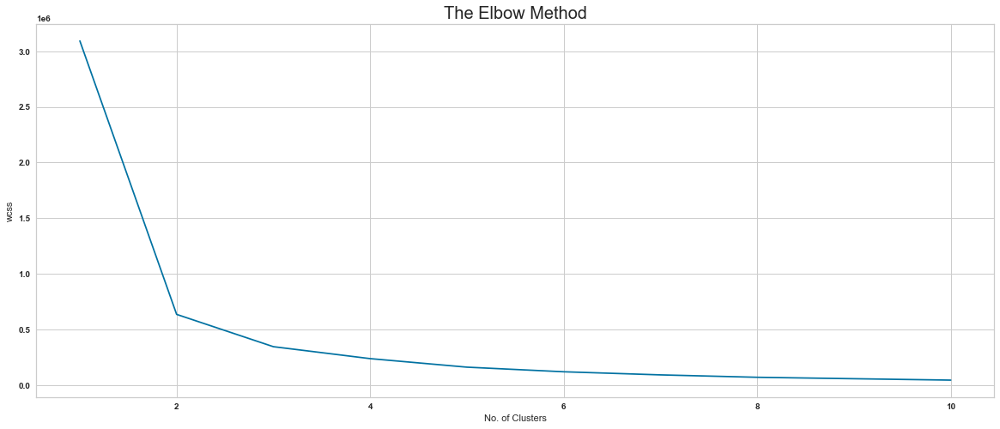

In [61]:
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    km.fit(x)
    wcss.append(km.inertia_)

plt.figure(figsize=(20,8))
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')

Using the value of k calculated above (3) we can therefore find the k clusters. Each cluster has a different color associated with it. The teal-colored left cluster consists of both days with high coronavirus research and few daily positives, so it's probably days at the start of the pandemic, and days with low coronavirus research and few daily positives, so probably are days towards the end of the pandemic. The central cluster in pink, on the other hand, probably represents the days of the second phase of the pandemic in which there were more daily positives than the initial and final phases but less research on Covid-19. Finally, the yellow cluster on the right probably represents the days close to the central phase of the pandemic and its peak, with the highest daily positive values and the smallest number of searches. The centers of the various clusters obtained are represented in blue.

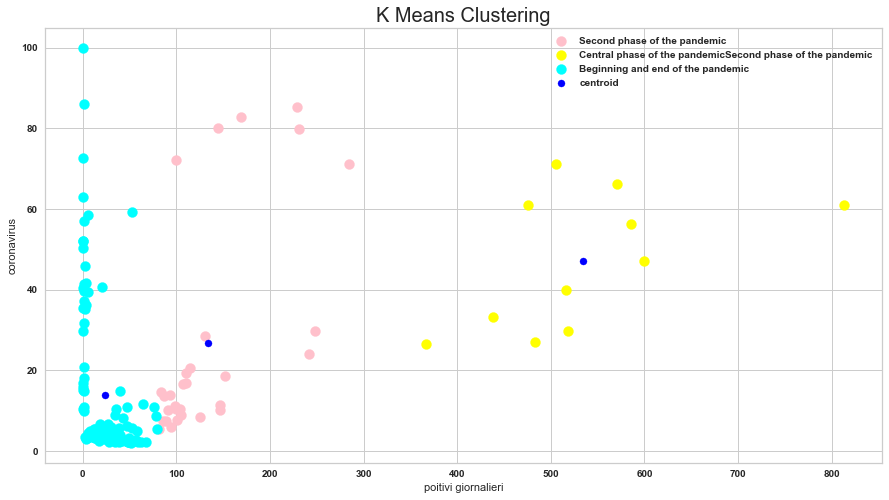

In [62]:
km = KMeans(n_clusters = 3, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.figure(figsize=(15,8))
plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Second phase of the pandemic')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'Central phase of the pandemicSecond phase of the pandemic')
plt.scatter(x[y_means == 2, 0], x[y_means == 2, 1], s = 100, c = 'cyan', label = 'Beginning and end of the pandemic')


plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centroid')

plt.title('K Means Clustering', fontsize = 20)
plt.xlabel('poitivi giornalieri')
plt.ylabel('coronavirus')
plt.legend()
plt.show()

In [63]:
t_province["confirmed_g"]=0
t_province["confirmed_g"].loc[3]=1
t_province["released_g"]=0
t_province["deceased_g"]=0
for i in t_province.index:
    if i>17:
        t_province["confirmed_g"].loc[i]=t_province["confirmed"].loc[i]-t_province["confirmed"].loc[i-17]
        t_province["released_g"].loc[i]=t_province["released"].loc[i]-t_province["released"].loc[i-17]
        t_province["deceased_g"].loc[i]=t_province["deceased"].loc[i]-t_province["deceased"].loc[i-17]
t_province.drop(['confirmed','released','deceased'], axis=1, inplace=True)
t_province.info()
t_province.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2771 entries, 0 to 2770
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   date         2771 non-null   datetime64[ns]
 1   time         2771 non-null   int64         
 2   province     2771 non-null   object        
 3   confirmed_g  2771 non-null   int64         
 4   released_g   2771 non-null   int64         
 5   deceased_g   2771 non-null   int64         
dtypes: datetime64[ns](1), int64(4), object(1)
memory usage: 130.0+ KB


,date,time,province,confirmed_g,released_g,deceased_g
0,2020-01-20,16,Seoul,0,0,0
1,2020-01-20,16,Busan,0,0,0
2,2020-01-20,16,Daegu,0,0,0
3,2020-01-20,16,Incheon,1,0,0
4,2020-01-20,16,Gwangju,0,0,0


In [64]:
t_province_ragg=t_province.groupby(by='province',as_index=False).sum()
t_province_ragg.drop(['time'], axis=1, inplace=True)
t_province_ragg.head()

,province,confirmed_g,released_g,deceased_g
0,Busan,154,142,3
1,Chungcheongbuk-do,65,60,0
2,Chungcheongnam-do,167,150,0
3,Daegu,6906,6700,189
4,Daejeon,117,44,1


In [84]:
t_province_ragg['population']= pd.Series([3393191, 1495984, 2000473, 2431774, 1490158, 1463650, 1466143, 11196053, 2575370, 3119571, 2632035,
                                    528411, 1766044, 1728749, 122263, 9631482, 1071673])

In [89]:
t_province_ragg.head()

,province,confirmed_g,released_g,deceased_g,population
0,Busan,154,142,3,3393191
1,Chungcheongbuk-do,65,60,0,1495984
2,Chungcheongnam-do,167,150,0,2000473
3,Daegu,6906,6700,189,2431774
4,Daejeon,117,44,1,1490158


In this scatterplot the various provinces of South Korea are represented based on the sum of deceased and positive people. Each bubble represents a city and the size and color are chosen based on the number of inhabitants of the province. It can be observed that the provinces are divided into three groups, one consisting of the provinces least affected by the virus in terms of deaths and infections (the largest group), another consisting of the slightly more affected provinces including Seoul, Gyeonggi -do and Gyeonsangbuk-do and finally the province that recorded the most infections and deaths was Daegu, despite having a much smaller number of inhabitants than provinces such as Gyeonsangbuk-do and Seoul. Scrolling with the pointer over the various points, you can see the name of the province and its population and you can see that Daegu was the most affected province, even if this was not shown in the "p-info" dataset, it probably means that they are not All data on patients in this province were collected. This scatterplot was obtained using the "t-province-ragg" dataset, obtained following a groupby operation on the columns of the "t-province" dataset and adding data on the number of inhabitants of the various provinces.

In [88]:
plt.figure(figsize=(15,8))
fig = px.scatter(t_province_ragg, x="confirmed_g", y="deceased_g",size="population", color="population",hover_name="province", log_x=False, size_max=30)
fig.show()

<Figure size 1080x576 with 0 Axes>

A further division into clusters can then be carried out between research on coronavirus, flu, colds and pneumonia. First, as in the previous cases, we consider the k-means method. To find k, the Elbow method is used as before. Once the graph of the underlying inertia is obtained, the k is considered for which there is the last significant slope variation. Again k = 3 was chosen.

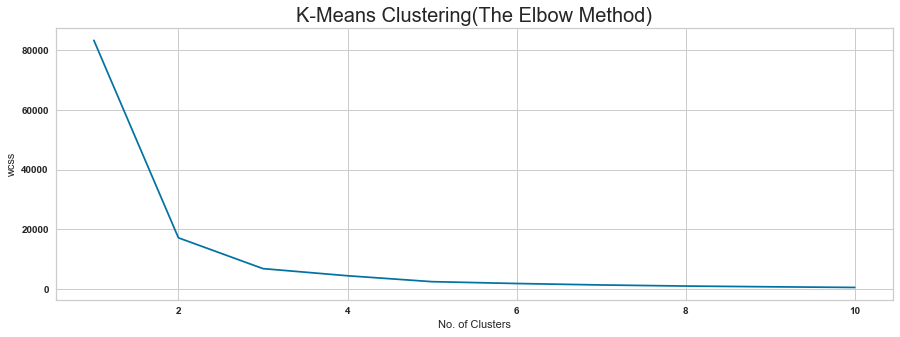

In [68]:
from sklearn.cluster import KMeans

x = trend_time[['cold','flu','pneumonia','coronavirus']].values
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(15,5))
plt.plot(range(1, 11), wcss)
plt.title('K-Means Clustering(The Elbow Method)', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

In this case, since more than two variables are involved, the clusters cannot be viewed in a two-dimensional space, so PCA was used to project information from a four-dimensional space to a two-dimensional one. The three clusters that are obtained are these. Their centers are almost overlapping but this is due to the fact that we are viewing in two dimensions what should be displayed in four dimensions, therefore also the understanding of the clusters is more complex than in the previous cases, but most likely they were created by identifying days with low, medium and high online searches for various pathologies.

In [70]:
from sklearn.decomposition import PCA

pca_x = PCA(n_components=2, svd_solver="auto").fit_transform(x)

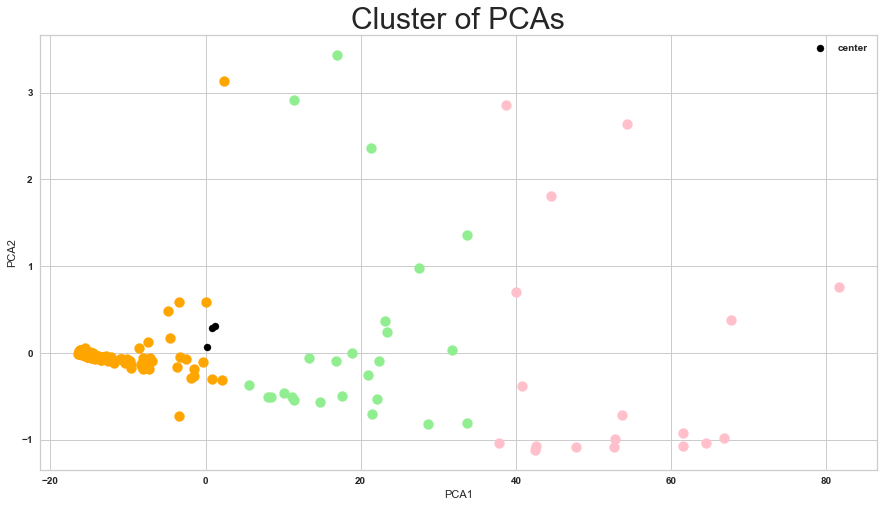

In [71]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
ymeans = kmeans.fit_predict(x)

plt.figure(figsize=(15,8))
plt.title('Cluster of PCAs', fontsize = 30)

plt.scatter(pca_x[ymeans == 0, 0], pca_x[ymeans == 0, 1], s = 100, c = 'pink')
plt.scatter(pca_x[ymeans == 1, 0], pca_x[ymeans == 1, 1], s = 100, c = 'orange')
plt.scatter(pca_x[ymeans == 2, 0], pca_x[ymeans == 2, 1], s = 100, c = 'lightgreen')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s = 50, c = 'black', label="center")

plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

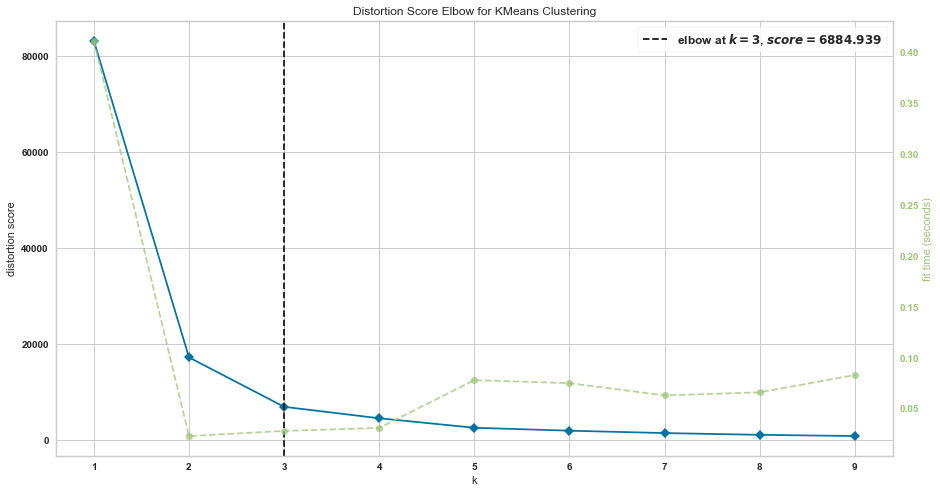

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [72]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,10))

plt.figure(figsize=(15,8))
visualizer.fit(x)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

# Classification

Finally, to visualize the goodness of the clusters thus obtained, the visualization of silhouettes was used. It is observed that two of the three silhouettes cross the vertical dotted line and do not have samples with a negative silhouette, while the silhouette of the first cluster does not cross the line, indicating that the first cluster is not optimal.

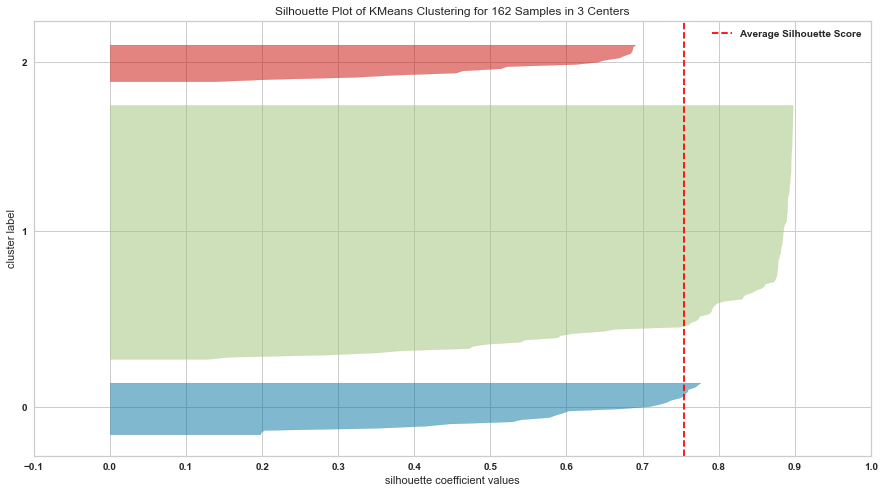

<AxesSubplot:title={'center':'Silhouette Plot of KMeans Clustering for 162 Samples in 3 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [73]:
# Instantiate the clustering model and visualizer
model = KMeans(3, random_state=42)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')

plt.figure(figsize=(15,8))
visualizer.fit(x)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

In [74]:
data_inizio_covid= pd.to_datetime('2020-01-20')
search['coronavirus_presence']=0 
for i in search.index:
    if search.date.loc[i]>=data_inizio_covid:
        search.coronavirus_presence.loc[i]=1
        
search['coronavirus_presence'] =search['coronavirus_presence'].astype(float)
search.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1642 entries, 0 to 1641
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   date                  1642 non-null   datetime64[ns]
 1   cold                  1642 non-null   float64       
 2   flu                   1642 non-null   float64       
 3   pneumonia             1642 non-null   float64       
 4   coronavirus           1642 non-null   float64       
 5   coronavirus_presence  1642 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 77.1 KB


In [75]:
# Class balance
search1=search.drop('date', axis=1)
co = search1[search1.coronavirus_presence== 1]
no_co = search1[search1.coronavirus_presence== 0]
print("CORONAVIRUS_PRESENCE: ", len(co), "CORONAVIRUS_ABSENCE", len(no_co))

CORONAVIRUS_PRESENCE:  162 CORONAVIRUS_ABSENCE 1480


In [76]:
balanced_search = pd.concat([co, no_co.sample(len(co))])
x = balanced_search.iloc[:,:-1]
y = balanced_search.iloc[:,-1:]
balanced_search.shape

(324, 5)

After an analysis of the clusters into which the available data can be divided, classifications are now considered between the days based on the presence or absence of Covid-19. A column indicating the presence of the coronavirus has been added to the “search” dataset, since this dataset contains searches for the word “coronavirus”, which however was searched even before the virus appeared. At this point, having the dataset many more observations with the value of "coronavirus-presence" equal to false compared to the true value, it was decided to balance it. Once this was done, the correlation matrix between the research on coronavirus, pneumonia, colds and flu and the presence of the virus was displayed. It is noted that there is a correlation of 0.61 between research on coronavirus and the presence of the virus, 0.21 between research on pneumonia and the presence of the virus and 0.18 between research on colds and presence of the virus.

<AxesSubplot:>

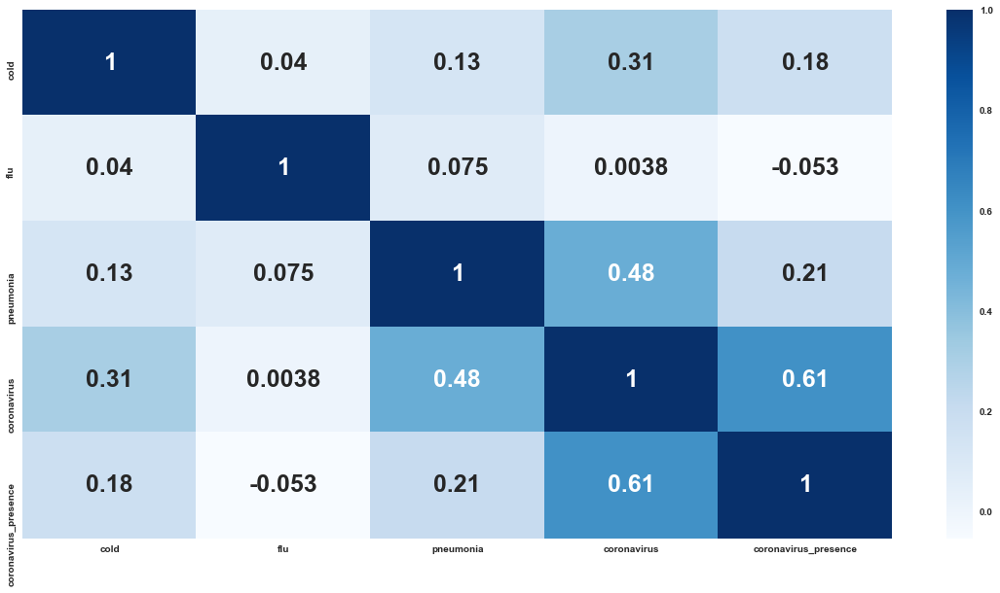

In [77]:
# Check for correlation
#d.corr() #less representative way
plt.figure(figsize=(20,10))
sns.heatmap(search1[search1.columns].corr(),cmap="Blues",annot=True,annot_kws={"fontsize":25})
#sns.heatmap(seoul_info.corr(), cmap = 'YlGnBu', annot = True, annot_kws={"fontsize": 16}) 

In [78]:
# Random state
rs = 42

# Split the data to check which algorithms learn better (later on we can check )
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=rs)

# look at the shape of the data (many problems can arise from wrong shape)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(259, 4)
(65, 4)
(259, 1)
(65, 1)


In [83]:
# List of classifiers:
classifiers = [
    LogisticRegression(random_state = rs),
    DecisionTreeClassifier(random_state=rs),
    SVC(probability=True),
    LinearDiscriminantAnalysis(),
    AdaBoostClassifier((DecisionTreeClassifier(random_state=rs)), random_state=rs, learning_rate=0.1),
    RandomForestClassifier(n_estimators = 10, random_state=rs),
    GradientBoostingClassifier(random_state=rs),
]

# List of results that will occure:
clf_name = [] # names of the classifiers
model_results = pd.DataFrame.copy(y_test) #resulting of prediction from the models

kfold = StratifiedKFold(n_splits=10) #cross-validation
cv_results = [] # scores from cross validation
cv_acc = [] # mean accuracy from cross validation, need to maximize
cv_std = [] # standard deviation from cross validation, need to minimise

cnfm = [] #confusion matrix
clr = [] #classification report
roc_auc = [] #roc curve:
roc_tpr = []
roc_fpr = []

In [84]:
# Training the algorithms and results
for clf in classifiers:
    name = clf.__class__.__name__
    clf_name.append(name)
    
    #fitting and predictions
    model = clf.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    model_results[name] = y_pred
    
    #accuracy and log loss
    cv_results.append(cross_val_score(clf, x_train, y_train, scoring = "accuracy",cv = kfold))
    acc = round(accuracy_score(y_test, y_pred), 2) #need to maximize
    train_pred = clf.predict_proba(x_test)
    print(f'Accuracy: {acc} \t ---> {name} ')
    
    #confusion matrix, clasification report, roc curve
    cnfm.append(confusion_matrix(y_test, y_pred))
    clr.append(classification_report(y_test, y_pred))
    fpr, tpr, thresholds = roc_curve(y_pred, y_test)
    roc_auc.append(auc(fpr, tpr))
    roc_tpr.append(tpr)
    roc_fpr.append(fpr)
    

for i in cv_results:
    cv_acc.append(i.mean())
    cv_std.append(i.std())

Accuracy: 1.0 	 ---> LogisticRegression 
Accuracy: 1.0 	 ---> DecisionTreeClassifier 
Accuracy: 1.0 	 ---> SVC 
Accuracy: 0.71 	 ---> LinearDiscriminantAnalysis 
Accuracy: 1.0 	 ---> AdaBoostClassifier 
Accuracy: 1.0 	 ---> RandomForestClassifier 
Accuracy: 1.0 	 ---> GradientBoostingClassifier 


The goal is to classify the days based on the presence of the virus or not, using information on internet searches for various diseases. In particular, we want to use different classifiers, comparing their results. The accuracy of the individual classification techniques is displayed through this histogram. It can be observed that the accuracy is very high, equal to 1, except in a case where it is 0.77.

Text(0.5, 1.0, 'Cross validation scores')

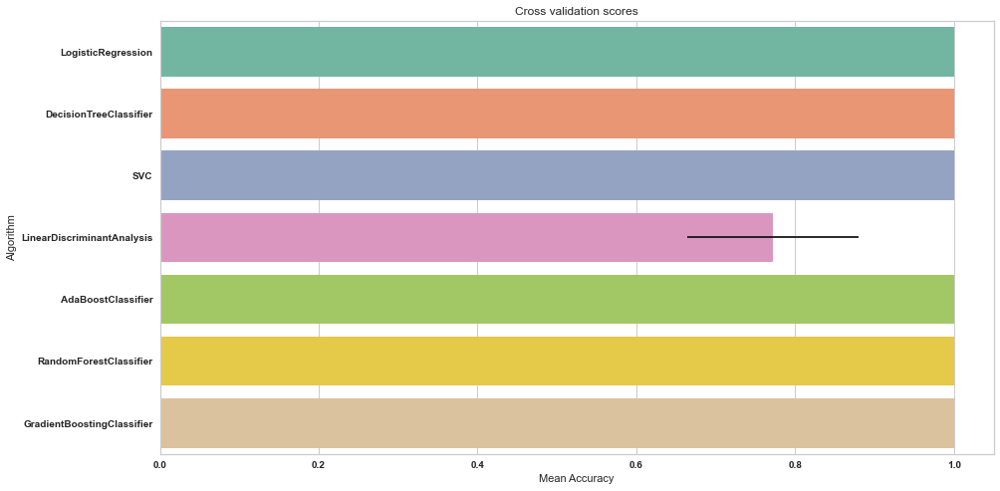

In [85]:
# Cross validation accuracy results graph
cv_res = pd.DataFrame({"CrossValMeans":cv_acc, "CrossValerrors": cv_std,"Algorithm":clf_name})

plt.figure(figsize=(15,8))
sns.barplot("CrossValMeans","Algorithm",data = cv_res, palette="Set2",orient = "h",**{'xerr':cv_std})
plt.xlabel("Mean Accuracy")
plt.title("Cross validation scores")

The following confusion matrices show how all but one of the classifiers classify correctly in all cases, while only the linear discriminant analysis classifier does not correctly classify 15 days of the virus, instead classifying them as virus-free days.

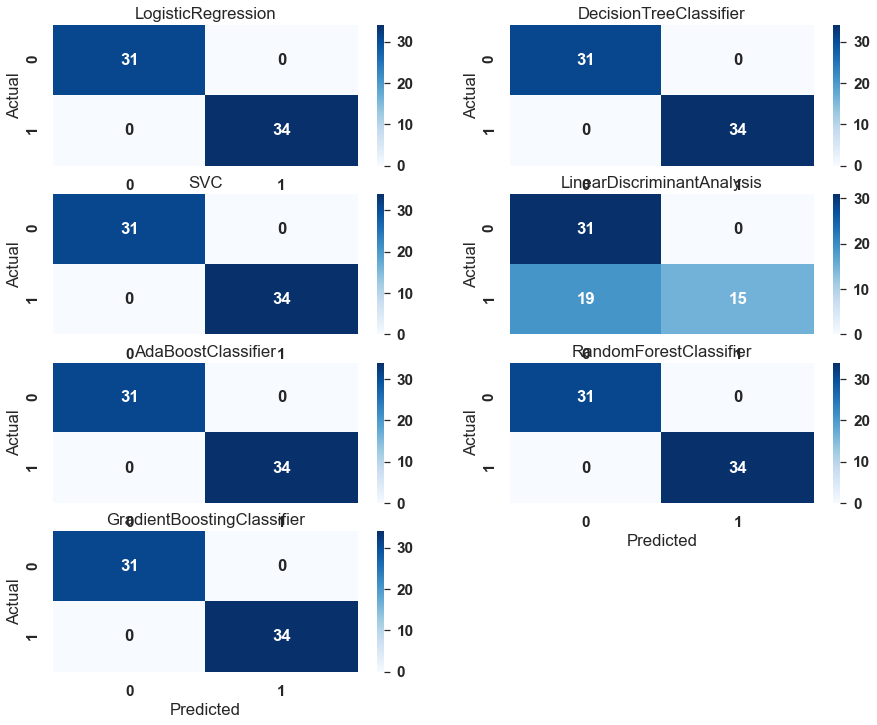

In [86]:
# Confusion matrixes (not-normalized confusion matrix)
plt.figure(figsize=(15,15))
sns.set(font_scale=1.4)
for i in range(len(classifiers)):
    plt.subplot(5,2,i+1) #adjust this acourding to the number of algorithms
    sns.heatmap(cnfm[i], annot=True, fmt="d",cmap="Blues")
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(clf_name[i])

In [87]:
#Classification reports
for i in range(len(classifiers)):
    print (f"{clf_name[i]} Classification Report:" );
    print (clr[i]);

LogisticRegression Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        31
         1.0       1.00      1.00      1.00        34

    accuracy                           1.00        65
   macro avg       1.00      1.00      1.00        65
weighted avg       1.00      1.00      1.00        65

DecisionTreeClassifier Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        31
         1.0       1.00      1.00      1.00        34

    accuracy                           1.00        65
   macro avg       1.00      1.00      1.00        65
weighted avg       1.00      1.00      1.00        65

SVC Classification Report:
              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00        31
         1.0       1.00      1.00      1.00        34

    accuracy                           1.00        65
   macro avg 

The following ROC curves also indicate the operation of the various classifiers. As you can see, all but one of the classifiers work very well, as the curves go to 1 almost instantly.

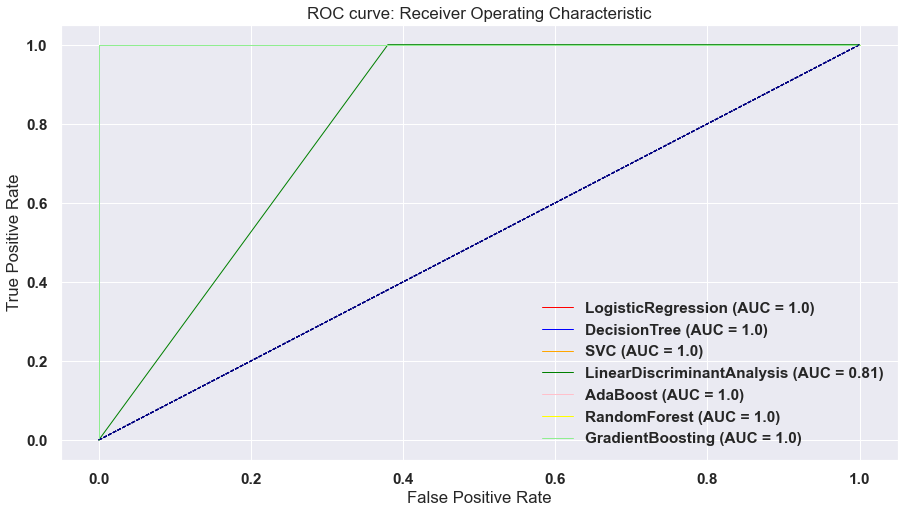

In [88]:
# ROC Curve
plt.figure(figsize=(15,8))
for i in range(len(classifiers)):
    cm = ['red', 'blue', 'orange', 'green', 'pink', 'yellow', 'lightgreen', 'black', 'purple', 'lightblue'] #add more colours for more algorithms
    plt.plot(roc_fpr[i], roc_tpr[i], c=cm[i], lw=1, label=clf_name[i].replace("Classifier", "") + " (AUC = " + str(round(roc_auc[i],2)) + ")")
    plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC curve: Receiver Operating Characteristic')
    plt.legend(loc="lower right")

A second classification that we want to do now, always based on the presence of the virus or not, is to use the information on the internet searches of the various diseases except those on the coronavirus, replacing this information with information on the weather conditions in the days, which may have influenced the movements of people over the various days and having had an important role in the ability of various viruses to spread. As can be seen from the following correlation matrix, this meteorological information has very low correlation with the presence of the coronavirus, as expected, however this information was still used to make classification to see how the various classifiers would have worked.

In [89]:
weather_ragg1=weather.groupby(by='date',as_index=False).sum()
weather_ragg=weather.groupby(by='date',as_index=False).mean()
weather_ragg.precipitation= weather_ragg1.precipitation
weather_ragg.drop('code', axis=1, inplace=True)
weather_ragg.info()
weather_ragg.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1642 entries, 0 to 1641
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   date                   1642 non-null   datetime64[ns]
 1   avg_temp               1642 non-null   float64       
 2   min_temp               1642 non-null   float64       
 3   max_temp               1642 non-null   float64       
 4   precipitation          1642 non-null   float64       
 5   max_wind_speed         1642 non-null   float64       
 6   most_wind_direction    1642 non-null   float64       
 7   avg_relative_humidity  1642 non-null   float64       
dtypes: datetime64[ns](1), float64(7)
memory usage: 115.5 KB


,date,avg_temp,min_temp,max_temp,precipitation,max_wind_speed,most_wind_direction,avg_relative_humidity
0,2016-01-01,3.11875,-1.6625,7.86875,0.0,4.61250,215.00,66.11250
1,2016-01-02,6.67500,2.3875,11.68125,0.0,4.73125,225.00,70.92500
2,2016-01-03,7.56875,3.5500,13.15625,0.0,3.66250,241.25,77.26875
3,2016-01-04,6.25625,1.9125,10.41875,0.0,5.28750,271.25,56.38750
4,2016-01-05,1.71250,-0.8125,5.16875,10.5,4.90000,245.00,41.88750


In [90]:
search_w = pd.merge(weather_ragg,search[['cold','flu','pneumonia','date','coronavirus_presence']],
                            how = 'inner', on = ['date'])
search_w.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1642 entries, 0 to 1641
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   date                   1642 non-null   datetime64[ns]
 1   avg_temp               1642 non-null   float64       
 2   min_temp               1642 non-null   float64       
 3   max_temp               1642 non-null   float64       
 4   precipitation          1642 non-null   float64       
 5   max_wind_speed         1642 non-null   float64       
 6   most_wind_direction    1642 non-null   float64       
 7   avg_relative_humidity  1642 non-null   float64       
 8   cold                   1642 non-null   float64       
 9   flu                    1642 non-null   float64       
 10  pneumonia              1642 non-null   float64       
 11  coronavirus_presence   1642 non-null   float64       
dtypes: datetime64[ns](1), float64(11)
memory usage: 166.8 KB


In [91]:
# Class balance
search_w.drop('date', axis=1, inplace=True)
cor = search_w[search_w.coronavirus_presence== 1]
no_cor = search_w[search_w.coronavirus_presence== 0]
print("CORONAVIRUS_PRESENCE: ", len(cor), "CORONAVIRUS_ABSENCE", len(no_cor))

CORONAVIRUS_PRESENCE:  162 CORONAVIRUS_ABSENCE 1480


In [92]:
balanced_search_w = pd.concat([cor, no_cor.sample(len(cor))])
x = balanced_search_w.iloc[:,:-1]
y = balanced_search_w.iloc[:,-1:]
balanced_search_w.shape

(324, 11)

<AxesSubplot:>

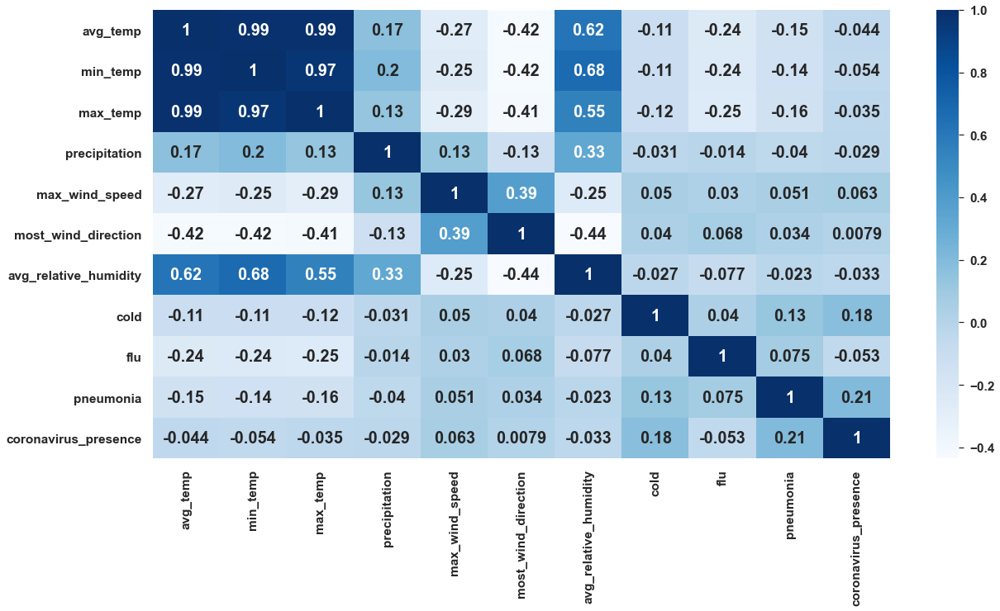

In [93]:
# Check for correlation
plt.figure(figsize=(20,10))
sns.heatmap(search_w[search_w.columns].corr(),cmap="Blues",annot=True,annot_kws={"fontsize":20})
#sns.heatmap(seoul_info.corr(), cmap = 'YlGnBu', annot = True, annot_kws={"fontsize": 16}) 

In [94]:
# Random state
rs = 42

# Split the data to check which algorithms learn better (later on we can check )
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=rs)

# look at the shape of the data (many problems can arise from wrong shape)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(259, 10)
(65, 10)
(259, 1)
(65, 1)


In [97]:
# List of classifiers:
classifiers = [
    LogisticRegression(random_state = rs),
    DecisionTreeClassifier(random_state=rs),
    SVC(probability=True),
    LinearDiscriminantAnalysis(),
    AdaBoostClassifier((DecisionTreeClassifier(random_state=rs)), random_state=rs, learning_rate=0.1),
    RandomForestClassifier(n_estimators = 10, random_state=rs),
    GradientBoostingClassifier(random_state=rs),
]

# List of results that will occure:
clf_name = [] # names of the classifiers
model_results = pd.DataFrame.copy(y_test) #resulting of prediction from the models

kfold = StratifiedKFold(n_splits=10) #cross-validation
cv_results = [] # scores from cross validation
cv_acc = [] # mean accuracy from cross validation, need to maximize
cv_std = [] # standard deviation from cross validation, need to minimise

cnfm = [] #confusion matrix
clr = [] #classification report
roc_auc = [] #roc curve:
roc_tpr = []
roc_fpr = []

In [98]:
# Training the algorithms and results
for clf in classifiers:
    name = clf.__class__.__name__
    clf_name.append(name)
    
    #fitting and predictions
    model = clf.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    model_results[name] = y_pred
    
    #accuracy and log loss
    cv_results.append(cross_val_score(clf, x_train, y_train, scoring = "accuracy",cv = kfold))
    acc = round(accuracy_score(y_test, y_pred), 2) #need to maximize
    train_pred = clf.predict_proba(x_test)
    print(f'Accuracy: {acc} \t ---> {name} ')
    
    #confusion matrix, clasification report, roc curve
    cnfm.append(confusion_matrix(y_test, y_pred))
    clr.append(classification_report(y_test, y_pred))
    fpr, tpr, thresholds = roc_curve(y_pred, y_test)
    roc_auc.append(auc(fpr, tpr))
    roc_tpr.append(tpr)
    roc_fpr.append(fpr)
    

for i in cv_results:
    cv_acc.append(i.mean())
    cv_std.append(i.std())

Accuracy: 0.71 	 ---> LogisticRegression 
Accuracy: 0.86 	 ---> DecisionTreeClassifier 
Accuracy: 0.6 	 ---> SVC 
Accuracy: 0.69 	 ---> LinearDiscriminantAnalysis 
Accuracy: 0.86 	 ---> AdaBoostClassifier 
Accuracy: 0.91 	 ---> RandomForestClassifier 
Accuracy: 0.91 	 ---> GradientBoostingClassifier 


Always using the same classifiers you want to make a comparison of their operation as in the previous case. The accuracy of the individual classification techniques is displayed through this histogram. It is observed that four of them have very good accuracy, higher than 0.90, while the one with the worst accuracy is the SVC with 0.51.

Text(0.5, 1.0, 'Cross validation scores')

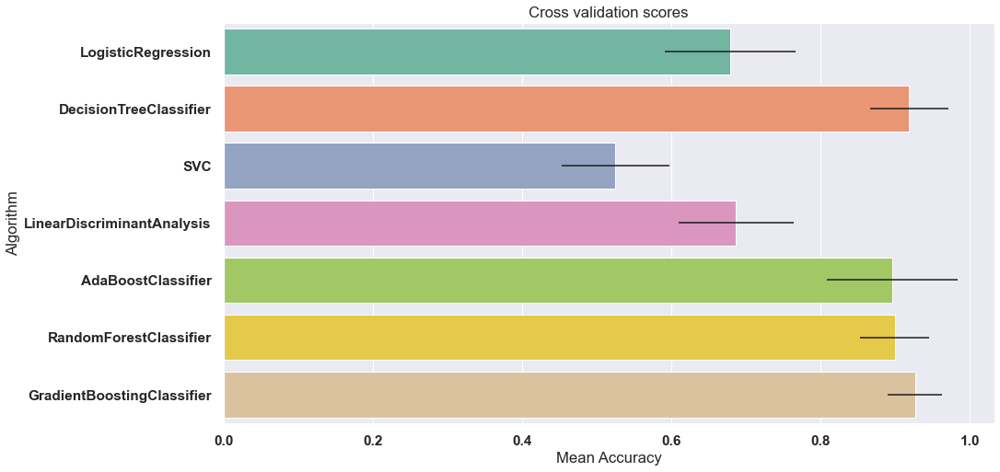

In [99]:
# Cross validation accuracy results graph
cv_res = pd.DataFrame({"CrossValMeans":cv_acc, "CrossValerrors": cv_std,"Algorithm":clf_name})

plt.figure(figsize=(15,8))
sns.barplot("CrossValMeans","Algorithm",data = cv_res, palette="Set2",orient = "h",**{'xerr':cv_std})
plt.xlabel("Mean Accuracy")
plt.title("Cross validation scores")

The following confusion matrices show that the four classifiers with higher accuracy correctly classify the days in almost all cases, while, as expected, those with lower accuracy, such as SVC, commit many more classification errors.

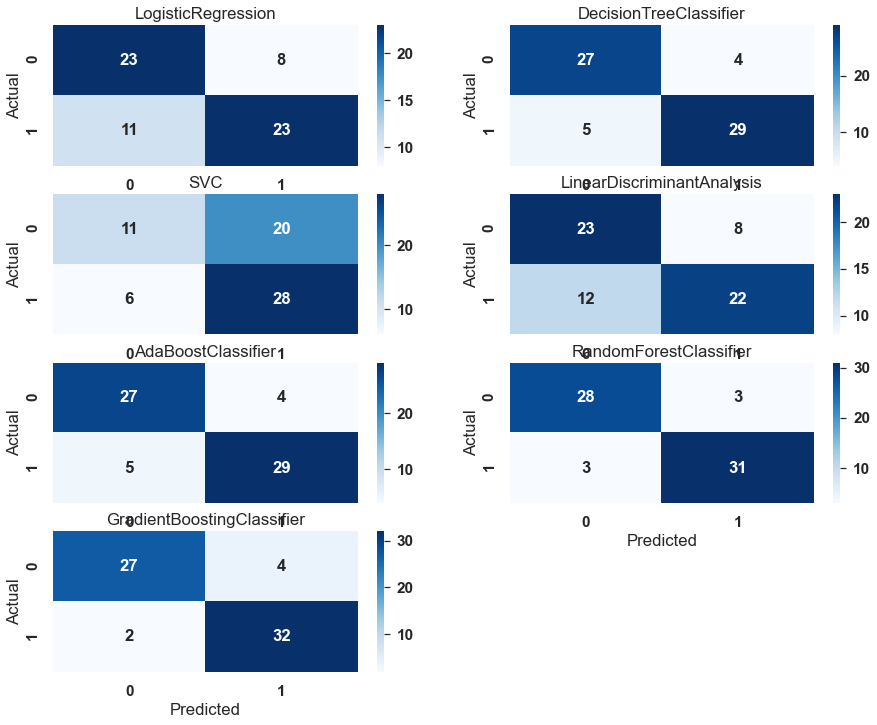

In [100]:
# Confusion matrixes (not-normalized confusion matrix)
plt.figure(figsize=(15,15))
sns.set(font_scale=1.4)
for i in range(len(classifiers)):
    plt.subplot(5,2,i+1) #adjust this acourding to the number of algorithms
    sns.heatmap(cnfm[i], annot=True, fmt="d",cmap="Blues")
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(clf_name[i])

In [101]:
#Classification reports
for i in range(len(classifiers)):
    print (f"{clf_name[i]} Classification Report:" );
    print (clr[i]);

LogisticRegression Classification Report:
              precision    recall  f1-score   support

         0.0       0.68      0.74      0.71        31
         1.0       0.74      0.68      0.71        34

    accuracy                           0.71        65
   macro avg       0.71      0.71      0.71        65
weighted avg       0.71      0.71      0.71        65

DecisionTreeClassifier Classification Report:
              precision    recall  f1-score   support

         0.0       0.84      0.87      0.86        31
         1.0       0.88      0.85      0.87        34

    accuracy                           0.86        65
   macro avg       0.86      0.86      0.86        65
weighted avg       0.86      0.86      0.86        65

SVC Classification Report:
              precision    recall  f1-score   support

         0.0       0.65      0.35      0.46        31
         1.0       0.58      0.82      0.68        34

    accuracy                           0.60        65
   macro avg 

The following ROC curves also indicate the operation of the various classifiers. Compared to the previous case, in this case the curves have a smaller initial slope, as the accuracy obtained is smaller. In particular, the SVC works very badly.

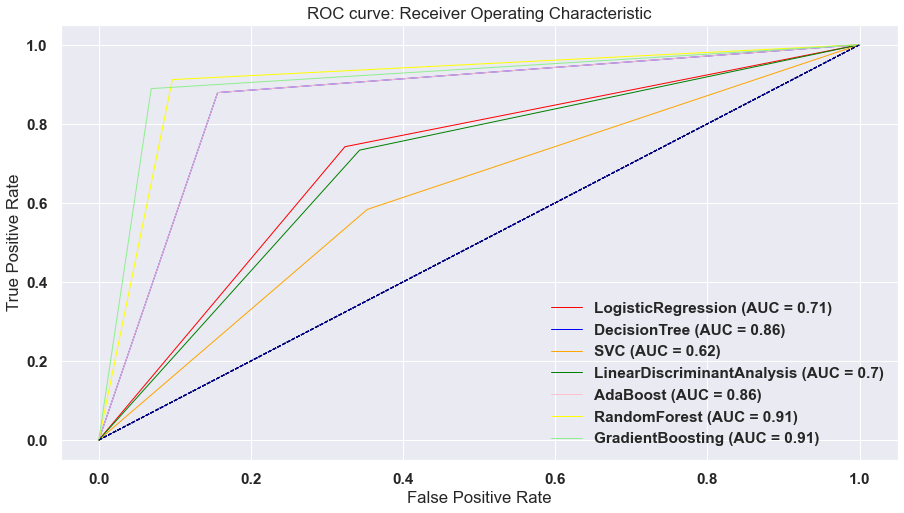

In [102]:
# ROC Curve
plt.figure(figsize=(15,8))
for i in range(len(classifiers)):
    cm = ['red', 'blue', 'orange', 'green', 'pink', 'yellow', 'lightgreen', 'black', 'purple', 'lightblue'] #add more colours for more algorithms
    plt.plot(roc_fpr[i], roc_tpr[i], c=cm[i], lw=1, label=clf_name[i].replace("Classifier", "") + " (AUC = " + str(round(roc_auc[i],2)) + ")")
    plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC curve: Receiver Operating Characteristic')
    plt.legend(loc="lower right")


In [403]:
# Search grid for optimal parameters

DT_param = {"max_depth": [2,3,8,10],
            "max_features": [0.3, 0.7, 1],
            "min_samples_split": [2, 3, 10],
            "min_samples_leaf": [1, 3, 10],
            "criterion": ["gini"]}

RF_param = {"max_depth": [None],
            "max_features": [0.3, 0.7, 1],
            "min_samples_split": [2, 3, 10],
            "min_samples_leaf": [1, 3, 10],
            "bootstrap": [False],
            "n_estimators" :[100,300],
            "criterion": ["gini"]}

GB_param = {'loss' : ["deviance"],
            'n_estimators' : [100,200,300],
            'learning_rate': [0.1, 0.05, 0.01],
            'max_depth': [4, 8],
            'min_samples_leaf': [100,150],
            'max_features': [0.3, 0.1]}

#using 4 n_jobs for faster processing
DTgs = GridSearchCV(DecisionTreeClassifier(), param_grid=DT_param, cv=kfold, n_jobs=4, scoring="accuracy", verbose = 1)
RFgs = GridSearchCV(RandomForestClassifier(), param_grid=RF_param, cv=kfold, n_jobs=4, scoring="accuracy", verbose = 1)
GBgs = GridSearchCV(GradientBoostingClassifier(), param_grid=GB_param, cv=kfold, n_jobs=4, scoring="accuracy", verbose = 1)

models = [DTgs, RFgs, GBgs]

gs_model = []
score = []

for model in models:
    model.fit(x_train, y_train)
    gs_model.append(model.best_estimator_)
    score.append(model.best_score_)

Fitting 10 folds for each of 108 candidates, totalling 1080 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  68 tasks      | elapsed:    3.7s
[Parallel(n_jobs=4)]: Done 1080 out of 1080 | elapsed:    7.8s finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 54 candidates, totalling 540 fits


[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    7.2s
[Parallel(n_jobs=4)]: Done 192 tasks      | elapsed:   33.1s
[Parallel(n_jobs=4)]: Done 442 tasks      | elapsed:  1.4min
[Parallel(n_jobs=4)]: Done 540 out of 540 | elapsed:  1.6min finished
[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.


Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=4)]: Done  76 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 376 tasks      | elapsed:   15.9s
[Parallel(n_jobs=4)]: Done 720 out of 720 | elapsed:   30.6s finished


In [404]:
# scores without gridsearch
print("score without GridSearchCV: ", cv_acc[:2])
# scores with gridsearch
print("score with GridSearchCV: ", score)

score without GridSearchCV:  [0.6944615384615384, 0.8266153846153846]
score with GridSearchCV:  [0.8806153846153848, 0.9152307692307691, 0.7336923076923076]


The correlation between the various classification methods is shown in the following correlation matrix to see the correlation of the models of the various methods, and thus understand if there are classifiers that return the same results.
Finally, a classifier was created consisting of the union of the three decisiontree methods, randomforset and gradientboosting, according to a voting system. The final classifier thus obtained has a final accuracy greater than 0.9, therefore very good.

Text(0.5, 1.0, 'Correlation between models')

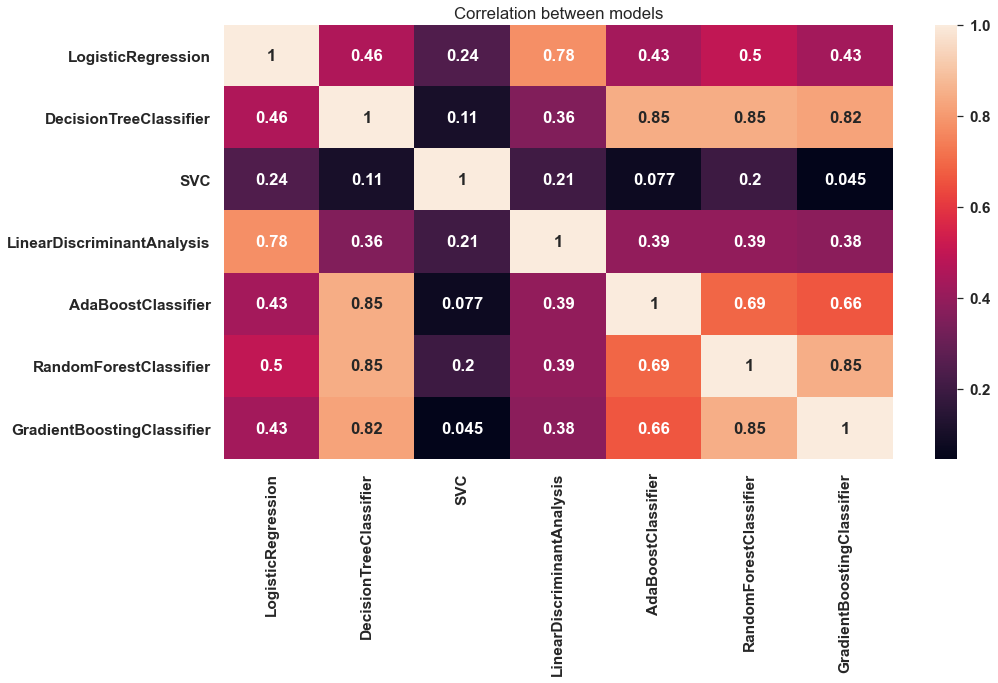

In [406]:
# Check for correlation between models: Make a correlation graph
plt.figure(figsize=(15,8))
sns.heatmap(model_results.drop("coronavirus_presence", axis=1).corr(),annot=True)
plt.title("Correlation between models")

In [407]:
# Do model ensembling
best_model = VotingClassifier(estimators=[('dt', gs_model[0]), ('rf', gs_model[1]), ('gb',gs_model[2])], 
                              voting='soft', n_jobs=4)
best_model.fit(x_train,y_train)
print(accuracy_score(y_test,best_model.predict(x_test)))

0.9384615384615385
